# To-dos (13/11/23)

1. Remove fits to log, only use fit_short
2. Investigate the bad fits for the slices 
3. Confirm that the mcmc really does work for the entire fit
4. Plot the curve using [a, b, c, d] and play around with these values
5. Fix d = 0.5, and add "error parameters" for the temperature (eT + f) 
6. Run mcmc for this starting from e = 1, f = 0
7. Just use the entire series as your fit function

In [1]:
import emcee as mc #try markov chain monte carlo

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import data_analysis_script as da
import importlib as im
from scipy.optimize import curve_fit, minimize
import emcee as mc #try markov chain monte carlo

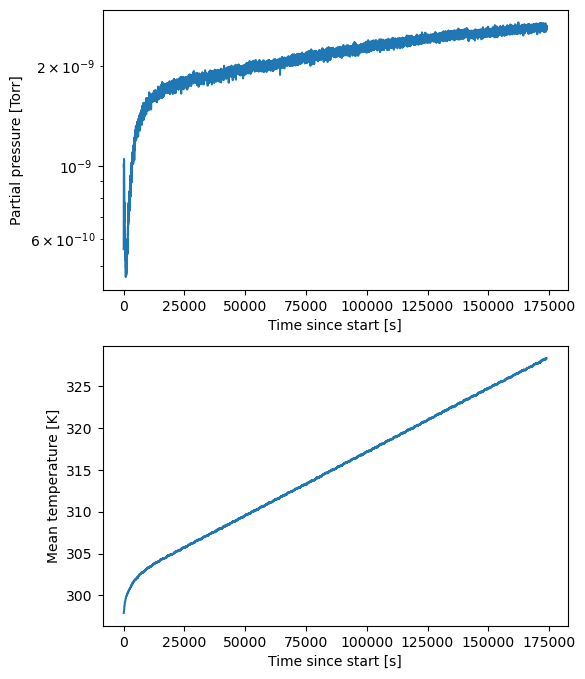

In [3]:
from data_analysis import Dataset
run_label = '2024-06-03' ## Change this to look at different runs
d = Dataset(run_label=run_label, gases=['O2'], data_path='20240603/')
d.GetData()
d.PlotSingleGas('O2')

In [4]:
time = np.array(d.data['O2']['Exposure_time'])
temp = np.array(d.data['O2']['Mean_temp']) #['Mean_temp'])
p = np.array(d.data['O2']['Partial_pressure'])

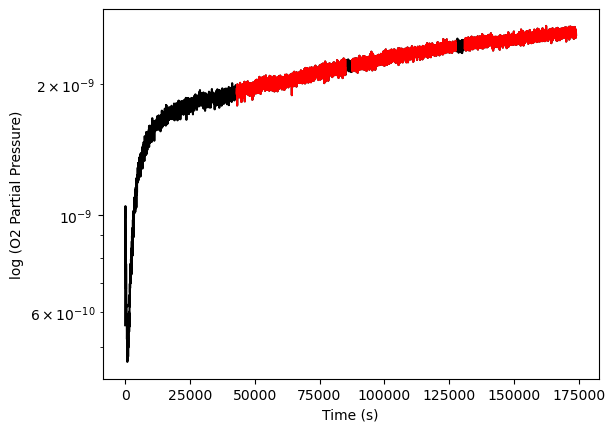

In [5]:
time_slices = [[43000, 85000],
               [87500, 127500],
               [131000, 175000]]

plt.semilogy(time, p, 'k') # Plot the logarithm (base 10) of the partial pressure of O2 (oxygen) against time. 
plt.ylabel('log (O2 Partial Pressure)') 
plt.xlabel('Time (s)')

for ts in time_slices:
    gpts = (time > ts[0]) & (time < ts[1])
    plt.semilogy(time[gpts], p[gpts],'r')
#plt.ylim(2e-10, 2e-9)
#plt.xlim(12e4, 14e4)
plt.show()

# MCMC

In [6]:
def combined_chisq_short(params, data_list, y):
    ds = Dataset("","","")
    ndsets = len(data_list)

    a, b, c, e, f = params[0], params[1], params[2], params[3], params[4]


    tot_chisq = 0
    sig = 0.5e-9 ## error on values
    e_err = 0.1
    f_err = 1
    

    for n in range(ndsets):
        cdat = data_list[n]
        cy = y[n]
        curr_chisq = np.sum(((d.fitfunction_short_temp_offset(cdat, a, b, c, e, f) - cy)/sig)**2) + ((e - 1)/(2*e_err))**2 + ((f - 0)/(2*f_err))**2
        if(not np.isnan(curr_chisq)):
            tot_chisq += curr_chisq
        else:
            tot_chisq += np.inf

    print(tot_chisq)
    return tot_chisq

time_slices = [[43000, 85000],
               [87500, 127500],
               [131000, 175000]]
tT = []
y = []
combined_data = []
for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT.append((np.vstack((time[gpts], temp[gpts]))))
    y.append(p[gpts])
    combined_data.append([time[gpts], p[gpts]])

In [7]:
spars = np.array([5e-3, 6000, 0, 1, 0])
print(combined_chisq_short(spars, tT, y))
res = minimize(combined_chisq_short, spars, args=(tT, y), method='Nelder-Mead', options={"maxiter": 10000})

(2, 1371)
(2, 1307)
(2, 1403)
18674.0707634441
18674.0707634441
(2, 1371)
(2, 1307)
(2, 1403)
18674.0707634441
(2, 1371)
(2, 1307)
(2, 1403)
16597.460482445906
(2, 1371)
(2, 1307)
(2, 1403)
38455.710715651556
(2, 1371)
(2, 1307)
(2, 1403)
18674.07081571617
(2, 1371)
(2, 1307)
(2, 1403)
3005.9673667387515
(2, 1371)
(2, 1307)
(2, 1403)
18673.755963730746
(2, 1371)
(2, 1307)
(2, 1403)
2037.450887455809
(2, 1371)
(2, 1307)
(2, 1403)
67787.85620429917
(2, 1371)
(2, 1307)
(2, 1403)
2642.9584445877153
(2, 1371)
(2, 1307)
(2, 1403)
1789.71296126467
(2, 1371)
(2, 1307)
(2, 1403)
18150.359834607454
(2, 1371)
(2, 1307)
(2, 1403)
12359.226282824467
(2, 1371)
(2, 1307)
(2, 1403)
52414.39798587243
(2, 1371)
(2, 1307)
(2, 1403)
5640.004487208142
(2, 1371)
(2, 1307)
(2, 1403)
13709.757705838723
(2, 1371)
(2, 1307)
(2, 1403)
2799.30478814516
(2, 1371)
(2, 1307)
(2, 1403)
7460.940518974802
(2, 1371)
(2, 1307)
(2, 1403)
2666.818834561205
(2, 1371)
(2, 1307)
(2, 1403)
3628.8779785419306
(2, 1371)
(2, 1307

192.10151800541854
(2, 1371)
(2, 1307)
(2, 1403)
192.40283543940058
(2, 1371)
(2, 1307)
(2, 1403)
192.70054403773804
(2, 1371)
(2, 1307)
(2, 1403)
191.80754161301718
(2, 1371)
(2, 1307)
(2, 1403)
191.7683195458571
(2, 1371)
(2, 1307)
(2, 1403)
192.06291872964357
(2, 1371)
(2, 1307)
(2, 1403)
193.0133769399951
(2, 1371)
(2, 1307)
(2, 1403)
192.03340626692145
(2, 1371)
(2, 1307)
(2, 1403)
192.7088036427777
(2, 1371)
(2, 1307)
(2, 1403)
192.08504074858868
(2, 1371)
(2, 1307)
(2, 1403)
191.9224329325792
(2, 1371)
(2, 1307)
(2, 1403)
192.0753385186
(2, 1371)
(2, 1307)
(2, 1403)
191.90453180264439
(2, 1371)
(2, 1307)
(2, 1403)
191.8535269876196
(2, 1371)
(2, 1307)
(2, 1403)
192.53135112683077
(2, 1371)
(2, 1307)
(2, 1403)
191.78083860981366
(2, 1371)
(2, 1307)
(2, 1403)
192.34836886949068
(2, 1371)
(2, 1307)
(2, 1403)
191.79244066347175
(2, 1371)
(2, 1307)
(2, 1403)
191.95962891326664
(2, 1371)
(2, 1307)
(2, 1403)
191.766356040282
(2, 1371)
(2, 1307)
(2, 1403)
192.01040705093214
(2, 1371)
(2

In [8]:
print(res.x)

[2.38061864e+00 1.00684905e+04 4.21784370e-01 1.04158366e+00
 4.17442488e+00]


(2, 1371)
(2, 1307)
(2, 1403)


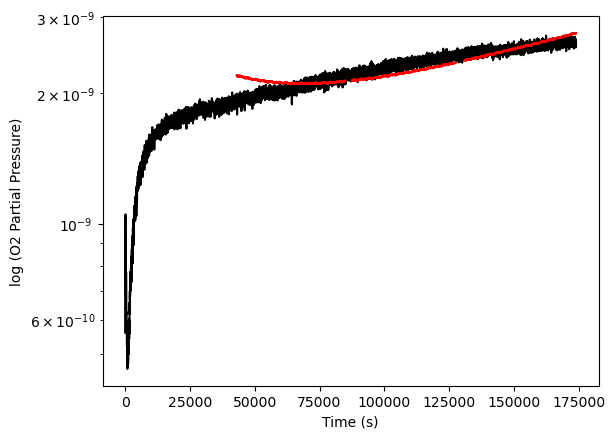

In [9]:
plt.figure()
plt.semilogy(time, p, 'k') # Plot the logarithm (base 10) of the partial pressure of O2 (oxygen) against time. 
for i in range(len(combined_data)):
    plt.plot(combined_data[i][0], np.abs(d.fitfunction_short_temp_offset(tT[i], *res.x)), 'r')
plt.ylabel('log (O2 Partial Pressure)') 
plt.xlabel('Time (s)')

#plt.ylim(2e-10, 2e-9)


plt.show()


In [10]:
print(res.x)

[2.38061864e+00 1.00684905e+04 4.21784370e-01 1.04158366e+00
 4.17442488e+00]


(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)


(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)


(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)


(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)
(2, 1371)


(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)


(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)
(2, 1307)


(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)
(2, 1403)


133.63433686825394
(2, 1371)
(2, 1307)
(2, 1403)
133.6343278358846
(2, 1371)
(2, 1307)
(2, 1403)
133.60974681899606
(2, 1371)
(2, 1307)
(2, 1403)
133.60974756897645
(2, 1371)
(2, 1307)
(2, 1403)
133.60974681731108
(2, 1371)
(2, 1307)
(2, 1403)
133.60974681898432
(2, 1371)
(2, 1307)
(2, 1403)
133.60976260643633
(2, 1371)
(2, 1307)
(2, 1403)
133.60974686711253
(2, 1371)
(2, 1307)
(2, 1403)
133.58237888159195
(2, 1371)
(2, 1307)
(2, 1403)
133.58237964425396
(2, 1371)
(2, 1307)
(2, 1403)
133.58237887987607
(2, 1371)
(2, 1307)
(2, 1403)
133.58237888158078
(2, 1371)
(2, 1307)
(2, 1403)
133.58239496299223
(2, 1371)
(2, 1307)
(2, 1403)
133.58237893203295
(2, 1371)
(2, 1307)
(2, 1403)
133.5330387424802
(2, 1371)
(2, 1307)
(2, 1403)
133.5330395577704
(2, 1371)
(2, 1307)
(2, 1403)
133.53303874060978
(2, 1371)
(2, 1307)
(2, 1403)
133.533038742469
(2, 1371)
(2, 1307)
(2, 1403)
133.53305628529907
(2, 1371)
(2, 1307)
(2, 1403)
133.53303879920946
(2, 1371)
(2, 1307)
(2, 1403)
133.44380105116582
(2, 13

(2, 1307)
(2, 1403)
44.834241087756936
(2, 1371)
(2, 1307)
(2, 1403)
44.83373690026618
(2, 1371)
(2, 1307)
(2, 1403)
44.83424109167745
(2, 1371)
(2, 1307)
(2, 1403)
44.83424108776052
(2, 1371)
(2, 1307)
(2, 1403)
44.83422060357889
(2, 1371)
(2, 1307)
(2, 1403)
44.83424102277089
(2, 1371)
(2, 1307)
(2, 1403)
44.7851258739755
(2, 1371)
(2, 1307)
(2, 1403)
44.785061952893145
(2, 1371)
(2, 1307)
(2, 1403)
44.78512587454169
(2, 1371)
(2, 1307)
(2, 1403)
44.78512587397592
(2, 1371)
(2, 1307)
(2, 1403)
44.78512287970058
(2, 1371)
(2, 1307)
(2, 1403)
44.78512586446881
(2, 1371)
(2, 1307)
(2, 1403)
44.75889175874565
(2, 1371)
(2, 1307)
(2, 1403)
44.758824244157644
(2, 1371)
(2, 1307)
(2, 1403)
44.75889175933663
(2, 1371)
(2, 1307)
(2, 1403)
44.7588917587461
(2, 1371)
(2, 1307)
(2, 1403)
44.75888865239018
(2, 1371)
(2, 1307)
(2, 1403)
44.758891749021316
(2, 1371)
(2, 1307)
(2, 1403)
44.730281595316534
(2, 1371)
(2, 1307)
(2, 1403)
44.73013482495724
(2, 1371)
(2, 1307)
(2, 1403)
44.7302815964826


(1000.0, 190000.0)

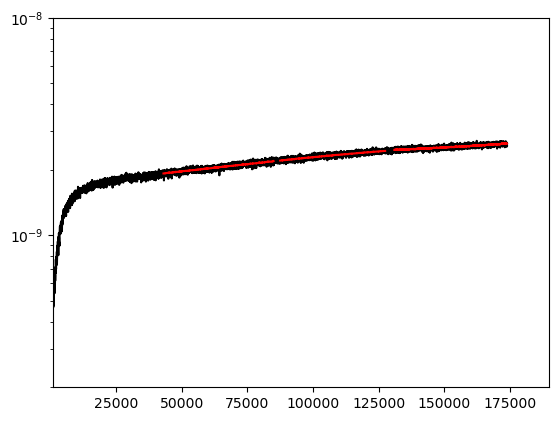

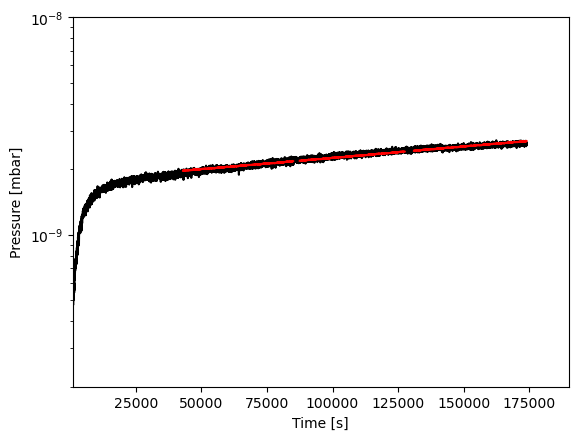

In [11]:
#Plotting Code

time_slices = [[43000, 85000],
               [87500, 127500],
               [131000, 175000]]

#Plot with different fit parameters for each time slice

plt.figure()
plt.semilogy(time, p, 'k')

for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT = np.vstack((time[gpts], temp[gpts]))
    y = p[gpts]
    spars = [1.29648471e-01, 7.99649264e+03, -1.11283810e-01, 9.99999525e-01, -3.72000013e-03]
    #spars = [3.48859880e-09, -3.45969798e+01, 3.98032858e-01, 1, 0]
    #Spars that work for curvefit: 3.48859880e-09, -3.45969798e+01, 3.98032858e-01, 1, 0
    #Spars from old teflon data: 3.48859880e-09, 3.45969798e+03, 3.98032858e-01, 1, 0
    #res = minimize(combined_chisq_short, spars, args=(combined_data), method='Nelder-Mead')
    #bp = res.x
    bp, bc = curve_fit(d.fitfunction_short_temp_offset, tT, y, p0=spars, method='lm', maxfev=90000)
    plt.plot(tT[0], d.fitfunction_short_temp_offset(tT,*bp),'r')
    print('bp:', bp)
    plt.ylim(2e-10, 1e-8)
    plt.xlim(1e3, 19e4)
    #res = minimize(combined_chisq_short, spars, args=(combined_data,))
    #bp = res.x
   

#Plot with the same fit parameters for all time slices
tT = []
y = []
combined_data = []
plt.figure()
plt.semilogy(time, p, 'k')
for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT.append((np.vstack((time[gpts], temp[gpts]))))
    y.append(p[gpts])
    combined_data.append([time[gpts], p[gpts]])
spars = [1.29648471e-01, 7.99649264e+03, -1.11283810e-01, 9.99999525e-01, -3.72000013e-03]
#spars = [7.08859880e-05, 3.45969798e+03, 1.28032858e+03, 1, 5]
#bp, bc = curve_fit(d.fitfunction_short_temp_offset, np.vstack((time,temp)), p, p0=spars, method='lm', maxfev=90000)
res = minimize(combined_chisq_short, spars, args=(tT, y))
bp = res.x


for j in range(len(time_slices)):
    tvals = combined_data[j][0]
    plt.plot(tvals, d.fitfunction_short_temp_offset(tT[j], *bp), 'r')
   
    

print('bp:', bp)

plt.ylabel('Pressure [mbar]')
plt.xlabel("Time [s]")
plt.ylim(2e-10, 1e-8)
plt.xlim(1e3, 19e4)



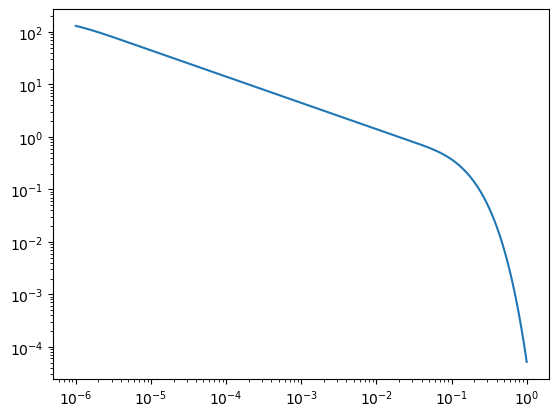

In [12]:
tvec = np.logspace(-6,0,1000)

maxn = 200

fval = np.zeros_like(tvec)
for n in range(maxn):
    fval += np.exp(-(np.pi*(2*n+1))**2*tvec)

plt.figure()
plt.loglog(tvec, fval)

In [ ]:
nwalkers, ndim = 100, 5

ffn = lambda p,d,y: -combined_chisq_short(p,d, y)

scaling_factors = np.array([1e-1, 7e+3, 1e-1, 9.9e-1, 3.7e-3])
p0 = [spars + scaling_factors*0.001*np.random.randn(ndim) for i in range(nwalkers)]
 
sampler = mc.EnsembleSampler(nwalkers, ndim, ffn, args=(tT,y))
sampler.run_mcmc(p0, 4000, progress=True)


(2, 1371)
(2, 1307)
(2, 1403)
13828.543533647253
(2, 1371)
(2, 1307)
(2, 1403)
13117.584807569445
(2, 1371)
(2, 1307)
(2, 1403)
12621.607687840344
(2, 1371)
(2, 1307)
(2, 1403)
14547.758637507162
(2, 1371)
(2, 1307)
(2, 1403)
13509.554452862081
(2, 1371)
(2, 1307)
(2, 1403)
14233.06422933111
(2, 1371)
(2, 1307)
(2, 1403)
12844.14927336679
(2, 1371)
(2, 1307)
(2, 1403)
14032.295171715941
(2, 1371)
(2, 1307)
(2, 1403)
12688.120411889637
(2, 1371)
(2, 1307)
(2, 1403)
13023.137670225873
(2, 1371)
(2, 1307)
(2, 1403)
14113.929244514231
(2, 1371)
(2, 1307)
(2, 1403)
13015.537513945092
(2, 1371)
(2, 1307)
(2, 1403)
13202.998521040565
(2, 1371)
(2, 1307)
(2, 1403)
13957.716883023611
(2, 1371)
(2, 1307)
(2, 1403)
13292.420812052767
(2, 1371)
(2, 1307)
(2, 1403)
12919.136239134805
(2, 1371)
(2, 1307)
(2, 1403)
12716.099092473314
(2, 1371)
(2, 1307)
(2, 1403)
13299.151140523216
(2, 1371)
(2, 1307)
(2, 1403)
12322.719542205912
(2, 1371)
(2, 1307)
(2, 1403)
14063.521438616019
(2, 1371)
(2, 1307)
(2

  0%|          | 7/4000 [00:00<01:03, 62.46it/s]

(2, 1371)
(2, 1307)
(2, 1403)
13860.423522220484
(2, 1371)
(2, 1307)
(2, 1403)
13979.367520603011
(2, 1371)
(2, 1307)
(2, 1403)
12795.677887808728
(2, 1371)
(2, 1307)
(2, 1403)
15216.274457033705
(2, 1371)
(2, 1307)
(2, 1403)
12828.927134568654
(2, 1371)
(2, 1307)
(2, 1403)
13348.300620859973
(2, 1371)
(2, 1307)
(2, 1403)
13998.393762055724
(2, 1371)
(2, 1307)
(2, 1403)
13451.770584673182
(2, 1371)
(2, 1307)
(2, 1403)
12742.466419581608
(2, 1371)
(2, 1307)
(2, 1403)
13981.679331768612
(2, 1371)
(2, 1307)
(2, 1403)
13575.522666463963
(2, 1371)
(2, 1307)
(2, 1403)
12895.948288572232
(2, 1371)
(2, 1307)
(2, 1403)
13656.223699996592
(2, 1371)
(2, 1307)
(2, 1403)
13605.920044672801
(2, 1371)
(2, 1307)
(2, 1403)
12382.15651080769
(2, 1371)
(2, 1307)
(2, 1403)
13828.169720989696
(2, 1371)
(2, 1307)
(2, 1403)
12632.970515749403
(2, 1371)
(2, 1307)
(2, 1403)
13067.415779947321
(2, 1371)
(2, 1307)
(2, 1403)
13017.167818795215
(2, 1371)
(2, 1307)
(2, 1403)
12509.76553709546
(2, 1371)
(2, 1307)
(2

  0%|          | 14/4000 [00:00<01:04, 61.40it/s]

(2, 1403)
14741.80479656893
(2, 1371)
(2, 1307)
(2, 1403)
7830.886221471101
(2, 1371)
(2, 1307)
(2, 1403)
13086.01279335286
(2, 1371)
(2, 1307)
(2, 1403)
14123.950792180996
(2, 1371)
(2, 1307)
(2, 1403)
8526.130391111934
(2, 1371)
(2, 1307)
(2, 1403)
13139.701201131604
(2, 1371)
(2, 1307)
(2, 1403)
8444.029412098304
(2, 1371)
(2, 1307)
(2, 1403)
1955.1109290983031
(2, 1371)
(2, 1307)
(2, 1403)
14430.36890698125
(2, 1371)
(2, 1307)
(2, 1403)
4354.055926182193
(2, 1371)
(2, 1307)
(2, 1403)
1363.9060638524413
(2, 1371)
(2, 1307)
(2, 1403)
1714.3364853194666
(2, 1371)
(2, 1307)
(2, 1403)
13175.50469816136
(2, 1371)
(2, 1307)
(2, 1403)
13738.902065849816
(2, 1371)
(2, 1307)
(2, 1403)
8337.497865282377
(2, 1371)
(2, 1307)
(2, 1403)
2157.590226986769
(2, 1371)
(2, 1307)
(2, 1403)
9500.759087688097
(2, 1371)
(2, 1307)
(2, 1403)
607.7834186193523
(2, 1371)
(2, 1307)
(2, 1403)
10572.578465603128
(2, 1371)
(2, 1307)
(2, 1403)
12896.247082451675
(2, 1371)
(2, 1307)
(2, 1403)
4157.682377682264
(2, 

  1%|          | 21/4000 [00:00<01:04, 61.76it/s]

(2, 1371)
(2, 1307)
(2, 1403)
12827.391140820637
(2, 1371)
(2, 1307)
(2, 1403)
6262.736924170729
(2, 1371)
(2, 1307)
(2, 1403)
10146.048582356947
(2, 1371)
(2, 1307)
(2, 1403)
12128.59890960385
(2, 1371)
(2, 1307)
(2, 1403)
10223.179987803975
(2, 1371)
(2, 1307)
(2, 1403)
4339.185546244493
(2, 1371)
(2, 1307)
(2, 1403)
11336.676869123767
(2, 1371)
(2, 1307)
(2, 1403)
12021.833935615292
(2, 1371)
(2, 1307)
(2, 1403)
10135.526938071347
(2, 1371)
(2, 1307)
(2, 1403)
10534.419190913497
(2, 1371)
(2, 1307)
(2, 1403)
7182.0053172078005
(2, 1371)
(2, 1307)
(2, 1403)
7900.71586329203
(2, 1371)
(2, 1307)
(2, 1403)
2941.4618836296104
(2, 1371)
(2, 1307)
(2, 1403)
1847.12911737206
(2, 1371)
(2, 1307)
(2, 1403)
9655.54204469148
(2, 1371)
(2, 1307)
(2, 1403)
27401.333920075984
(2, 1371)
(2, 1307)
(2, 1403)
7887.4134351210305
(2, 1371)
(2, 1307)
(2, 1403)
6074.431561522209
(2, 1371)
(2, 1307)
(2, 1403)
11225.904106018874
(2, 1371)
(2, 1307)
(2, 1403)
10398.46551063569
(2, 1371)
(2, 1307)
(2, 1403)
9

  1%|          | 42/4000 [00:00<01:03, 62.15it/s]

(2, 1371)
(2, 1307)
(2, 1403)
3425.9492042071306
(2, 1371)
(2, 1307)
(2, 1403)
1473.7848769726963
(2, 1371)
(2, 1307)
(2, 1403)
3389.9666643377313
(2, 1371)
(2, 1307)
(2, 1403)
1878.055121336137
(2, 1371)
(2, 1307)
(2, 1403)
500.95341568924346
(2, 1371)
(2, 1307)
(2, 1403)
1456.1044601417457
(2, 1371)
(2, 1307)
(2, 1403)
1631.4565757128462
(2, 1371)
(2, 1307)
(2, 1403)
2579.7711954518704
(2, 1371)
(2, 1307)
(2, 1403)
529.6483021744681
(2, 1371)
(2, 1307)
(2, 1403)
575.8945053865195
(2, 1371)
(2, 1307)
(2, 1403)
2100.092954503151
(2, 1371)
(2, 1307)
(2, 1403)
839.1308149156112
(2, 1371)
(2, 1307)
(2, 1403)
1721.4603967650255
(2, 1371)
(2, 1307)
(2, 1403)
4909.806878640375
(2, 1371)
(2, 1307)
(2, 1403)
7649.873258056454
(2, 1371)
(2, 1307)
(2, 1403)
3304.611979998358
(2, 1371)
(2, 1307)
(2, 1403)
5527.427490460389
(2, 1371)
(2, 1307)
(2, 1403)
4935.781583588638
(2, 1371)
(2, 1307)
(2, 1403)
674.386697594298
(2, 1371)
(2, 1307)
(2, 1403)
743.8031753880205
(2, 1371)
(2, 1307)
(2, 1403)
145

  1%|▏         | 56/4000 [00:00<01:03, 62.04it/s]

(2, 1307)
(2, 1403)
500.71469645486826
(2, 1371)
(2, 1307)
(2, 1403)
497.79365749131273
(2, 1371)
(2, 1307)
(2, 1403)
507.41236924529363
(2, 1371)
(2, 1307)
(2, 1403)
473.7199693018071
(2, 1371)
(2, 1307)
(2, 1403)
1773.71861958775
(2, 1371)
(2, 1307)
(2, 1403)
491.5379539956632
(2, 1371)
(2, 1307)
(2, 1403)
864.7380212438608
(2, 1371)
(2, 1307)
(2, 1403)
1436.0139547956214
(2, 1371)
(2, 1307)
(2, 1403)
479.036878581987
(2, 1371)
(2, 1307)
(2, 1403)
731.3656938919372
(2, 1371)
(2, 1307)
(2, 1403)
542.4803664526203
(2, 1371)
(2, 1307)
(2, 1403)
488.85389724750155
(2, 1371)
(2, 1307)
(2, 1403)
517.6115850976967
(2, 1371)
(2, 1307)
(2, 1403)
497.5665184675773
(2, 1371)
(2, 1307)
(2, 1403)
475.8710166397595
(2, 1371)
(2, 1307)
(2, 1403)
1029.7756940886634
(2, 1371)
(2, 1307)
(2, 1403)
508.5346273913351
(2, 1371)
(2, 1307)
(2, 1403)
484.66885456078694
(2, 1371)
(2, 1307)
(2, 1403)
776.8635408291219
(2, 1371)
(2, 1307)
(2, 1403)
498.849856701081
(2, 1371)
(2, 1307)
(2, 1403)
492.679597942976

  2%|▏         | 70/4000 [00:01<01:03, 61.69it/s]

(2, 1403)
452.29830426609374
(2, 1371)
(2, 1307)
(2, 1403)
496.756175749941
(2, 1371)
(2, 1307)
(2, 1403)
481.6721720295096
(2, 1371)
(2, 1307)
(2, 1403)
487.84122941823
(2, 1371)
(2, 1307)
(2, 1403)
498.52866900804486
(2, 1371)
(2, 1307)
(2, 1403)
451.50980538491444
(2, 1371)
(2, 1307)
(2, 1403)
494.685898536153
(2, 1371)
(2, 1307)
(2, 1403)
486.7427459063674
(2, 1371)
(2, 1307)
(2, 1403)
446.07375971769267
(2, 1371)
(2, 1307)
(2, 1403)
496.3322656633843
(2, 1371)
(2, 1307)
(2, 1403)
467.285463694329
(2, 1371)
(2, 1307)
(2, 1403)
543.9546303437444
(2, 1371)
(2, 1307)
(2, 1403)
535.3422914058624
(2, 1371)
(2, 1307)
(2, 1403)
486.2627862843716
(2, 1371)
(2, 1307)
(2, 1403)
484.9390317027984
(2, 1371)
(2, 1307)
(2, 1403)
462.42625526813765
(2, 1371)
(2, 1307)
(2, 1403)
507.9490376183528
(2, 1371)
(2, 1307)
(2, 1403)
450.4304505078725
(2, 1371)
(2, 1307)
(2, 1403)
444.9660927237609
(2, 1371)
(2, 1307)
(2, 1403)
607.219454622199
(2, 1371)
(2, 1307)
(2, 1403)
539.9353242151581
(2, 1371)
(2,

  2%|▏         | 84/4000 [00:01<01:03, 61.84it/s]

(2, 1307)
(2, 1403)
503.6237001765859
(2, 1371)
(2, 1307)
(2, 1403)
445.50421882012176
(2, 1371)
(2, 1307)
(2, 1403)
424.069724814104
(2, 1371)
(2, 1307)
(2, 1403)
430.30491359008414
(2, 1371)
(2, 1307)
(2, 1403)
379.45200308138874
(2, 1371)
(2, 1307)
(2, 1403)
452.35458022452514
(2, 1371)
(2, 1307)
(2, 1403)
474.87713186341307
(2, 1371)
(2, 1307)
(2, 1403)
424.4046231848565
(2, 1371)
(2, 1307)
(2, 1403)
447.96901195768123
(2, 1371)
(2, 1307)
(2, 1403)
439.8136034868999
(2, 1371)
(2, 1307)
(2, 1403)
459.0108479280895
(2, 1371)
(2, 1307)
(2, 1403)
503.0424646038906
(2, 1371)
(2, 1307)
(2, 1403)
393.5839259999389
(2, 1371)
(2, 1307)
(2, 1403)
883.1634712137418
(2, 1371)
(2, 1307)
(2, 1403)
459.51628229602073
(2, 1371)
(2, 1307)
(2, 1403)
4300.158218536024
(2, 1371)
(2, 1307)
(2, 1403)
397.65006830029654
(2, 1371)
(2, 1307)
(2, 1403)
477.5208833964582
(2, 1371)
(2, 1307)
(2, 1403)
353.92316016126296
(2, 1371)
(2, 1307)
(2, 1403)
385.1267049816752
(2, 1371)
(2, 1307)
(2, 1403)
361.75578164

  3%|▎         | 105/4000 [00:01<01:02, 61.96it/s]

(2, 1371)
(2, 1307)
(2, 1403)
393.02518211118826
(2, 1371)
(2, 1307)
(2, 1403)
372.3269187591388
(2, 1371)
(2, 1307)
(2, 1403)
344.43303824695835
(2, 1371)
(2, 1307)
(2, 1403)
345.31724863949324
(2, 1371)
(2, 1307)
(2, 1403)
406.60067814912543
(2, 1371)
(2, 1307)
(2, 1403)
396.89634837826895
(2, 1371)
(2, 1307)
(2, 1403)
425.0390171189423
(2, 1371)
(2, 1307)
(2, 1403)
358.6344785366886
(2, 1371)
(2, 1307)
(2, 1403)
401.3725767901761
(2, 1371)
(2, 1307)
(2, 1403)
382.14070068149266
(2, 1371)
(2, 1307)
(2, 1403)
378.43897843336435
(2, 1371)
(2, 1307)
(2, 1403)
1020.3299761730073
(2, 1371)
(2, 1307)
(2, 1403)
403.94585191330907
(2, 1371)
(2, 1307)
(2, 1403)
357.3605186555031
(2, 1371)
(2, 1307)
(2, 1403)
6346.5286343268945
(2, 1371)
(2, 1307)
(2, 1403)
558.4704988411557
(2, 1371)
(2, 1307)
(2, 1403)
608.615883816258
(2, 1371)
(2, 1307)
(2, 1403)
9213.30386906617
(2, 1371)
(2, 1307)
(2, 1403)
398.36531625318855
(2, 1371)
(2, 1307)
(2, 1403)
337.44501595742435
(2, 1371)
(2, 1307)
(2, 1403)


  3%|▎         | 119/4000 [00:01<01:03, 61.49it/s]

421.16761847384856
(2, 1371)
(2, 1307)
(2, 1403)
378.1291031805934
(2, 1371)
(2, 1307)
(2, 1403)
793.4562018385002
(2, 1371)
(2, 1307)
(2, 1403)
373.5036877982953
(2, 1371)
(2, 1307)
(2, 1403)
346.868628840221
(2, 1371)
(2, 1307)
(2, 1403)
354.3492491862796
(2, 1371)
(2, 1307)
(2, 1403)
317.7596395197366
(2, 1371)
(2, 1307)
(2, 1403)
342.03301990469186
(2, 1371)
(2, 1307)
(2, 1403)
309.6740285087334
(2, 1371)
(2, 1307)
(2, 1403)
358.06291582974075
(2, 1371)
(2, 1307)
(2, 1403)
395.51820104073613
(2, 1371)
(2, 1307)
(2, 1403)
352.11329093830796
(2, 1371)
(2, 1307)
(2, 1403)
433.5005865617842
(2, 1371)
(2, 1307)
(2, 1403)
598.6991489837786
(2, 1371)
(2, 1307)
(2, 1403)
343.11433602049846
(2, 1371)
(2, 1307)
(2, 1403)
340.0877636932931
(2, 1371)
(2, 1307)
(2, 1403)
356.9496723650637
(2, 1371)
(2, 1307)
(2, 1403)
350.31534952587197
(2, 1371)
(2, 1307)
(2, 1403)
345.105426060028
(2, 1371)
(2, 1307)
(2, 1403)
339.6541792067652
(2, 1371)
(2, 1307)
(2, 1403)
552.3409270539155
(2, 1371)
(2, 130

  4%|▎         | 140/4000 [00:02<01:02, 61.76it/s]

(2, 1371)
(2, 1307)
(2, 1403)
308.89127969579704
(2, 1371)
(2, 1307)
(2, 1403)
316.48325971867706
(2, 1371)
(2, 1307)
(2, 1403)
312.77694332861165
(2, 1371)
(2, 1307)
(2, 1403)
307.2945134975625
(2, 1371)
(2, 1307)
(2, 1403)
370.41126137093784
(2, 1371)
(2, 1307)
(2, 1403)
315.9590719419099
(2, 1371)
(2, 1307)
(2, 1403)
312.72665063366117
(2, 1371)
(2, 1307)
(2, 1403)
334.88514016556593
(2, 1371)
(2, 1307)
(2, 1403)
345.7759858486414
(2, 1371)
(2, 1307)
(2, 1403)
313.51588597418123
(2, 1371)
(2, 1307)
(2, 1403)
318.8318666159072
(2, 1371)
(2, 1307)
(2, 1403)
330.2337465771394
(2, 1371)
(2, 1307)
(2, 1403)
315.6562690463665
(2, 1371)
(2, 1307)
(2, 1403)
325.3125181515263
(2, 1371)
(2, 1307)
(2, 1403)
324.539312657393
(2, 1371)
(2, 1307)
(2, 1403)
330.4082226262841
(2, 1371)
(2, 1307)
(2, 1403)
301.801295657117
(2, 1371)
(2, 1307)
(2, 1403)
356.66570728800593
(2, 1371)
(2, 1307)
(2, 1403)
413.360896849721
(2, 1371)
(2, 1307)
(2, 1403)
317.9286370835603
(2, 1371)
(2, 1307)
(2, 1403)
326.7

  4%|▍         | 154/4000 [00:02<01:02, 61.93it/s]

(2, 1371)
(2, 1307)
(2, 1403)
1055.1882252319178
(2, 1371)
(2, 1307)
(2, 1403)
318.2553029241322
(2, 1371)
(2, 1307)
(2, 1403)
306.4689756600174
(2, 1371)
(2, 1307)
(2, 1403)
964.0906580639388
(2, 1371)
(2, 1307)
(2, 1403)
314.0569565910735
(2, 1371)
(2, 1307)
(2, 1403)
362.1618299257351
(2, 1371)
(2, 1307)
(2, 1403)
291.7886399310412
(2, 1371)
(2, 1307)
(2, 1403)
307.50737636199653
(2, 1371)
(2, 1307)
(2, 1403)
277.82410159799883
(2, 1371)
(2, 1307)
(2, 1403)
302.01616459863726
(2, 1371)
(2, 1307)
(2, 1403)
318.0547040895508
(2, 1371)
(2, 1307)
(2, 1403)
318.4854796021982
(2, 1371)
(2, 1307)
(2, 1403)
384.65952497428225
(2, 1371)
(2, 1307)
(2, 1403)
303.8499797994023
(2, 1371)
(2, 1307)
(2, 1403)
329.018543760622
(2, 1371)
(2, 1307)
(2, 1403)
316.3315650678444
(2, 1371)
(2, 1307)
(2, 1403)
312.4840136660299
(2, 1371)
(2, 1307)
(2, 1403)
306.88274347398897
(2, 1371)
(2, 1307)
(2, 1403)
302.5198460073242
(2, 1371)
(2, 1307)
(2, 1403)
307.92385231546416
(2, 1371)
(2, 1307)
(2, 1403)
405.

  4%|▍         | 168/4000 [00:02<01:01, 61.88it/s]

314.89448280237934
(2, 1371)
(2, 1307)
(2, 1403)
296.33063798000546
(2, 1371)
(2, 1307)
(2, 1403)
288.791283533926
(2, 1371)
(2, 1307)
(2, 1403)
406.84383072392393
(2, 1371)
(2, 1307)
(2, 1403)
299.8979893791683
(2, 1371)
(2, 1307)
(2, 1403)
275.1866830503901
(2, 1371)
(2, 1307)
(2, 1403)
274.93800734525297
(2, 1371)
(2, 1307)
(2, 1403)
3077.9757888069958
(2, 1371)
(2, 1307)
(2, 1403)
289.1438200413503
(2, 1371)
(2, 1307)
(2, 1403)
322.2291301978846
(2, 1371)
(2, 1307)
(2, 1403)
282.05777544371097
(2, 1371)
(2, 1307)
(2, 1403)
349.0611481135158
(2, 1371)
(2, 1307)
(2, 1403)
289.45448385070824
(2, 1371)
(2, 1307)
(2, 1403)
281.79146594645493
(2, 1371)
(2, 1307)
(2, 1403)
316.43685296285025
(2, 1371)
(2, 1307)
(2, 1403)
292.2068629336783
(2, 1371)
(2, 1307)
(2, 1403)
309.0507784275757
(2, 1371)
(2, 1307)
(2, 1403)
286.20439900578566
(2, 1371)
(2, 1307)
(2, 1403)
319.69926923032796
(2, 1371)
(2, 1307)
(2, 1403)
302.25482128775855
(2, 1371)
(2, 1307)
(2, 1403)
296.5336391722144
(2, 1371)
(

  5%|▍         | 182/4000 [00:02<01:01, 61.96it/s]

304.2572365207321
(2, 1371)
(2, 1307)
(2, 1403)
324.7543897526148
(2, 1371)
(2, 1307)
(2, 1403)
273.60520729161635
(2, 1371)
(2, 1307)
(2, 1403)
491.0480303142563
(2, 1371)
(2, 1307)
(2, 1403)
289.988247001738
(2, 1371)
(2, 1307)
(2, 1403)
290.0573878778638
(2, 1371)
(2, 1307)
(2, 1403)
275.5612458652332
(2, 1371)
(2, 1307)
(2, 1403)
276.2847016405688
(2, 1371)
(2, 1307)
(2, 1403)
296.74797828259
(2, 1371)
(2, 1307)
(2, 1403)
27153.594724191127
(2, 1371)
(2, 1307)
(2, 1403)
265.5572613970117
(2, 1371)
(2, 1307)
(2, 1403)
273.16011650973326
(2, 1371)
(2, 1307)
(2, 1403)
262.67843245131735
(2, 1371)
(2, 1307)
(2, 1403)
276.21568425189133
(2, 1371)
(2, 1307)
(2, 1403)
281.6656855012217
(2, 1371)
(2, 1307)
(2, 1403)
377.1170392400735
(2, 1371)
(2, 1307)
(2, 1403)
284.4583178863446
(2, 1371)
(2, 1307)
(2, 1403)
281.59236161659084
(2, 1371)
(2, 1307)
(2, 1403)
270.5813739736962
(2, 1371)
(2, 1307)
(2, 1403)
270.17650258104396
(2, 1371)
(2, 1307)
(2, 1403)
282.921730516835
(2, 1371)
(2, 1307)

  5%|▌         | 203/4000 [00:03<01:01, 62.16it/s]

(2, 1371)
(2, 1307)
(2, 1403)
254.22447963621826
(2, 1371)
(2, 1307)
(2, 1403)
275.7390432621444
(2, 1371)
(2, 1307)
(2, 1403)
441.2382147373794
(2, 1371)
(2, 1307)
(2, 1403)
289.24653812508944
(2, 1371)
(2, 1307)
(2, 1403)
260.7534751439912
(2, 1371)
(2, 1307)
(2, 1403)
313.04079535241914
(2, 1371)
(2, 1307)
(2, 1403)
299.6717289316928
(2, 1371)
(2, 1307)
(2, 1403)
264.3165566817581
(2, 1371)
(2, 1307)
(2, 1403)
263.90954357155755
(2, 1371)
(2, 1307)
(2, 1403)
252.6398742399968
(2, 1371)
(2, 1307)
(2, 1403)
275.2247643117442
(2, 1371)
(2, 1307)
(2, 1403)
285.2554439064714
(2, 1371)
(2, 1307)
(2, 1403)
265.75068029810933
(2, 1371)
(2, 1307)
(2, 1403)
298.6779726327083
(2, 1371)
(2, 1307)
(2, 1403)
271.49102332265545
(2, 1371)
(2, 1307)
(2, 1403)
271.33424175446834
(2, 1371)
(2, 1307)
(2, 1403)
346.7686921538364
(2, 1371)
(2, 1307)
(2, 1403)
287.7419152796452
(2, 1371)
(2, 1307)
(2, 1403)
275.0284815450715
(2, 1371)
(2, 1307)
(2, 1403)
269.33562927880234
(2, 1371)
(2, 1307)
(2, 1403)
26

  5%|▌         | 217/4000 [00:03<01:01, 61.70it/s]

(2, 1371)
(2, 1307)
(2, 1403)
246.88703332140946
(2, 1371)
(2, 1307)
(2, 1403)
253.42659487007273
(2, 1371)
(2, 1307)
(2, 1403)
250.55183075580732
(2, 1371)
(2, 1307)
(2, 1403)
264.14370334645815
(2, 1371)
(2, 1307)
(2, 1403)
280.3603019336615
(2, 1371)
(2, 1307)
(2, 1403)
262.7266562514952
(2, 1371)
(2, 1307)
(2, 1403)
248.78069706250753
(2, 1371)
(2, 1307)
(2, 1403)
253.5544102972489
(2, 1371)
(2, 1307)
(2, 1403)
268.1099668213561
(2, 1371)
(2, 1307)
(2, 1403)
259.53033694305645
(2, 1371)
(2, 1307)
(2, 1403)
265.242068092933
(2, 1371)
(2, 1307)
(2, 1403)
265.4469600269947
(2, 1371)
(2, 1307)
(2, 1403)
248.5259558375885
(2, 1371)
(2, 1307)
(2, 1403)
265.8781101766532
(2, 1371)
(2, 1307)
(2, 1403)
261.67238770860865
(2, 1371)
(2, 1307)
(2, 1403)
255.89898680764657
(2, 1371)
(2, 1307)
(2, 1403)
255.4391862856652
(2, 1371)
(2, 1307)
(2, 1403)
250.46379502349282
(2, 1371)
(2, 1307)
(2, 1403)
383.19961919285095
(2, 1371)
(2, 1307)
(2, 1403)
252.8558548235109
(2, 1371)
(2, 1307)
(2, 1403)
2

  6%|▌         | 238/4000 [00:03<01:00, 62.08it/s]

(2, 1371)
(2, 1307)
(2, 1403)
16233.350599183952
(2, 1371)
(2, 1307)
(2, 1403)
249.40548431059847
(2, 1371)
(2, 1307)
(2, 1403)
251.46875865636525
(2, 1371)
(2, 1307)
(2, 1403)
259.2871208669678
(2, 1371)
(2, 1307)
(2, 1403)
287.09545825003124
(2, 1371)
(2, 1307)
(2, 1403)
250.61327163326976
(2, 1371)
(2, 1307)
(2, 1403)
247.75973199706758
(2, 1371)
(2, 1307)
(2, 1403)
241.09296344409898
(2, 1371)
(2, 1307)
(2, 1403)
248.37385587285104
(2, 1371)
(2, 1307)
(2, 1403)
247.71732094095057
(2, 1371)
(2, 1307)
(2, 1403)
247.91376215835618
(2, 1371)
(2, 1307)
(2, 1403)
250.05984903700693
(2, 1371)
(2, 1307)
(2, 1403)
251.04221748973043
(2, 1371)
(2, 1307)
(2, 1403)
246.12287989800305
(2, 1371)
(2, 1307)
(2, 1403)
248.40577304348227
(2, 1371)
(2, 1307)
(2, 1403)
991.6095268298297
(2, 1371)
(2, 1307)
(2, 1403)
255.91560430178404
(2, 1371)
(2, 1307)
(2, 1403)
237.43284713261335
(2, 1371)
(2, 1307)
(2, 1403)
240.2001187044486
(2, 1371)
(2, 1307)
(2, 1403)
241.08908437255386
(2, 1371)
(2, 1307)
(2,

  6%|▋         | 252/4000 [00:04<01:00, 61.94it/s]

(2, 1307)
(2, 1403)
257.74392850684626
(2, 1371)
(2, 1307)
(2, 1403)
307.48493019915486
(2, 1371)
(2, 1307)
(2, 1403)
246.9927509200824
(2, 1371)
(2, 1307)
(2, 1403)
232.8915117191944
(2, 1371)
(2, 1307)
(2, 1403)
239.2798433627658
(2, 1371)
(2, 1307)
(2, 1403)
238.09384171286715
(2, 1371)
(2, 1307)
(2, 1403)
253.7339103920101
(2, 1371)
(2, 1307)
(2, 1403)
492.2494664020361
(2, 1371)
(2, 1307)
(2, 1403)
241.8698023517438
(2, 1371)
(2, 1307)
(2, 1403)
262.2405077665399
(2, 1371)
(2, 1307)
(2, 1403)
236.22595217685824
(2, 1371)
(2, 1307)
(2, 1403)
268.08181655619086
(2, 1371)
(2, 1307)
(2, 1403)
237.03490335210677
(2, 1371)
(2, 1307)
(2, 1403)
239.74309094028487
(2, 1371)
(2, 1307)
(2, 1403)
236.81283670830035
(2, 1371)
(2, 1307)
(2, 1403)
507.7058721298447
(2, 1371)
(2, 1307)
(2, 1403)
240.20301558580115
(2, 1371)
(2, 1307)
(2, 1403)
246.9573616178159
(2, 1371)
(2, 1307)
(2, 1403)
237.67802143947603
(2, 1371)
(2, 1307)
(2, 1403)
231.13257665922373
(2, 1371)
(2, 1307)
(2, 1403)
243.51261

  7%|▋         | 266/4000 [00:04<01:00, 61.96it/s]

(2, 1403)
218.59958434038137
(2, 1371)
(2, 1307)
(2, 1403)
228.81420342558377
(2, 1371)
(2, 1307)
(2, 1403)
236.99992073346493
(2, 1371)
(2, 1307)
(2, 1403)
307.6612713196176
(2, 1371)
(2, 1307)
(2, 1403)
234.31046465551225
(2, 1371)
(2, 1307)
(2, 1403)
255.48321563487582
(2, 1371)
(2, 1307)
(2, 1403)
8686.275212248513
(2, 1371)
(2, 1307)
(2, 1403)
221.62156222478598
(2, 1371)
(2, 1307)
(2, 1403)
244.9161588819207
(2, 1371)
(2, 1307)
(2, 1403)
244.04050440340046
(2, 1371)
(2, 1307)
(2, 1403)
241.93751689551885
(2, 1371)
(2, 1307)
(2, 1403)
248.47498237311137
(2, 1371)
(2, 1307)
(2, 1403)
230.69829497177238
(2, 1371)
(2, 1307)
(2, 1403)
296.82946587658205
(2, 1371)
(2, 1307)
(2, 1403)
244.22199583368422
(2, 1371)
(2, 1307)
(2, 1403)
241.20682129540137
(2, 1371)
(2, 1307)
(2, 1403)
237.5910449389351
(2, 1371)
(2, 1307)
(2, 1403)
298.3032039350189
(2, 1371)
(2, 1307)
(2, 1403)
225.98870564992112
(2, 1371)
(2, 1307)
(2, 1403)
501.63749463707484
(2, 1371)
(2, 1307)
(2, 1403)
230.62274487103

  7%|▋         | 280/4000 [00:04<01:00, 61.97it/s]

(2, 1307)
(2, 1403)
628.9772018192597
(2, 1371)
(2, 1307)
(2, 1403)
229.049584849556
(2, 1371)
(2, 1307)
(2, 1403)
224.42907594002912
(2, 1371)
(2, 1307)
(2, 1403)
224.6412855260007
(2, 1371)
(2, 1307)
(2, 1403)
319.6254618585588
(2, 1371)
(2, 1307)
(2, 1403)
9977.901258739828
(2, 1371)
(2, 1307)
(2, 1403)
226.80034773481654
(2, 1371)
(2, 1307)
(2, 1403)
247.830876897312
(2, 1371)
(2, 1307)
(2, 1403)
234.25559455028272
(2, 1371)
(2, 1307)
(2, 1403)
228.77809304520142
(2, 1371)
(2, 1307)
(2, 1403)
225.90759376705245
(2, 1371)
(2, 1307)
(2, 1403)
233.45314232334195
(2, 1371)
(2, 1307)
(2, 1403)
227.7949957565839
(2, 1371)
(2, 1307)
(2, 1403)
245.97902214890362
(2, 1371)
(2, 1307)
(2, 1403)
229.93657537083007
(2, 1371)
(2, 1307)
(2, 1403)
224.5004871863253
(2, 1371)
(2, 1307)
(2, 1403)
11496.279002165134
(2, 1371)
(2, 1307)
(2, 1403)
265.7420190428951
(2, 1371)
(2, 1307)
(2, 1403)
223.76488242146644
(2, 1371)
(2, 1307)
(2, 1403)
228.6602236167047
(2, 1371)
(2, 1307)
(2, 1403)
278.89745087

  7%|▋         | 294/4000 [00:04<00:59, 62.05it/s]

(2, 1403)
229.55289222143202
(2, 1371)
(2, 1307)
(2, 1403)
210.3048407320494
(2, 1371)
(2, 1307)
(2, 1403)
213.72218157138087
(2, 1371)
(2, 1307)
(2, 1403)
222.14101103381574
(2, 1371)
(2, 1307)
(2, 1403)
1007.8262463656705
(2, 1371)
(2, 1307)
(2, 1403)
286.3951122290068
(2, 1371)
(2, 1307)
(2, 1403)
224.48103693952336
(2, 1371)
(2, 1307)
(2, 1403)
493.19769471910206
(2, 1371)
(2, 1307)
(2, 1403)
89812.06403375012
(2, 1371)
(2, 1307)
(2, 1403)
225.64616882947377
(2, 1371)
(2, 1307)
(2, 1403)
217.32553277203678
(2, 1371)
(2, 1307)
(2, 1403)
230.69381209461875
(2, 1371)
(2, 1307)
(2, 1403)
238.8713933650205
(2, 1371)
(2, 1307)
(2, 1403)
218.69552274428767
(2, 1371)
(2, 1307)
(2, 1403)
221.6802063475775
(2, 1371)
(2, 1307)
(2, 1403)
232.65053106731796
(2, 1371)
(2, 1307)
(2, 1403)
230.830707517862
(2, 1371)
(2, 1307)
(2, 1403)
232.14333507513183
(2, 1371)
(2, 1307)
(2, 1403)
220.41342419029417
(2, 1371)
(2, 1307)
(2, 1403)
223.5555060400845
(2, 1371)
(2, 1307)
(2, 1403)
201.81173787779355

  8%|▊         | 315/4000 [00:05<00:59, 61.97it/s]

(2, 1371)
(2, 1307)
(2, 1403)
233.89141660630628
(2, 1371)
(2, 1307)
(2, 1403)
186.58579576518463
(2, 1371)
(2, 1307)
(2, 1403)
236.87407639366108
(2, 1371)
(2, 1307)
(2, 1403)
205.2777602201379
(2, 1371)
(2, 1307)
(2, 1403)
196.18482214027733
(2, 1371)
(2, 1307)
(2, 1403)
206.11258811014324
(2, 1371)
(2, 1307)
(2, 1403)
188.71602214900616
(2, 1371)
(2, 1307)
(2, 1403)
183.31948914834473
(2, 1371)
(2, 1307)
(2, 1403)
192.56582103101044
(2, 1371)
(2, 1307)
(2, 1403)
187.7917184634138
(2, 1371)
(2, 1307)
(2, 1403)
191.1255359724931
(2, 1371)
(2, 1307)
(2, 1403)
181.41386141685211
(2, 1371)
(2, 1307)
(2, 1403)
186.4320217044503
(2, 1371)
(2, 1307)
(2, 1403)
211.06458732494002
(2, 1371)
(2, 1307)
(2, 1403)
203.34197932197384
(2, 1371)
(2, 1307)
(2, 1403)
203.05499151843912
(2, 1371)
(2, 1307)
(2, 1403)
216.34412115230697
(2, 1371)
(2, 1307)
(2, 1403)
210.69265521743736
(2, 1371)
(2, 1307)
(2, 1403)
215.27648304342563
(2, 1371)
(2, 1307)
(2, 1403)
203.48067828956408
(2, 1371)
(2, 1307)
(2, 

  8%|▊         | 329/4000 [00:05<00:59, 61.94it/s]

(2, 1371)
(2, 1307)
(2, 1403)
186.2316485864779
(2, 1371)
(2, 1307)
(2, 1403)
183.34489548781258
(2, 1371)
(2, 1307)
(2, 1403)
179.2128932335912
(2, 1371)
(2, 1307)
(2, 1403)
187.30987963373673
(2, 1371)
(2, 1307)
(2, 1403)
147.67352751319683
(2, 1371)
(2, 1307)
(2, 1403)
255.4429766597766
(2, 1371)
(2, 1307)
(2, 1403)
181.46223304470894
(2, 1371)
(2, 1307)
(2, 1403)
197.04918868942093
(2, 1371)
(2, 1307)
(2, 1403)
150.22061996080902
(2, 1371)
(2, 1307)
(2, 1403)
165.76234976024125
(2, 1371)
(2, 1307)
(2, 1403)
185.20923501358013
(2, 1371)
(2, 1307)
(2, 1403)
185.92465316179252
(2, 1371)
(2, 1307)
(2, 1403)
153.98613595418712
(2, 1371)
(2, 1307)
(2, 1403)
169.06475792936732
(2, 1371)
(2, 1307)
(2, 1403)
1425.2731887500681
(2, 1371)
(2, 1307)
(2, 1403)
176.5196868872027
(2, 1371)
(2, 1307)
(2, 1403)
174.4356387711987
(2, 1371)
(2, 1307)
(2, 1403)
272.7732648669239
(2, 1371)
(2, 1307)
(2, 1403)
198.72314154029013
(2, 1371)
(2, 1307)
(2, 1403)
173.28736657938464
(2, 1371)
(2, 1307)
(2, 14

  9%|▊         | 343/4000 [00:05<00:58, 61.99it/s]

(2, 1307)
(2, 1403)
151.18964876330986
(2, 1371)
(2, 1307)
(2, 1403)
144.9237327182535
(2, 1371)
(2, 1307)
(2, 1403)
150.85712882422038
(2, 1371)
(2, 1307)
(2, 1403)
153.4119212159846
(2, 1371)
(2, 1307)
(2, 1403)
1771.4234355976785
(2, 1371)
(2, 1307)
(2, 1403)
161.79837664254612
(2, 1371)
(2, 1307)
(2, 1403)
158.31667875553586
(2, 1371)
(2, 1307)
(2, 1403)
149.35083632806655
(2, 1371)
(2, 1307)
(2, 1403)
153.86239749163502
(2, 1371)
(2, 1307)
(2, 1403)
160.39957395040256
(2, 1371)
(2, 1307)
(2, 1403)
140.26609853116713
(2, 1371)
(2, 1307)
(2, 1403)
199.51911897329276
(2, 1371)
(2, 1307)
(2, 1403)
131.09203405731012
(2, 1371)
(2, 1307)
(2, 1403)
295.62865984272594
(2, 1371)
(2, 1307)
(2, 1403)
142.05597639227665
(2, 1371)
(2, 1307)
(2, 1403)
183.94146335322264
(2, 1371)
(2, 1307)
(2, 1403)
194.7403598018257
(2, 1371)
(2, 1307)
(2, 1403)
135.5720264663231
(2, 1371)
(2, 1307)
(2, 1403)
136.411318221847
(2, 1371)
(2, 1307)
(2, 1403)
128.5111964928429
(2, 1371)
(2, 1307)
(2, 1403)
708.622

  9%|▉         | 357/4000 [00:05<00:58, 62.03it/s]

(2, 1403)
160.4690834931498
(2, 1371)
(2, 1307)
(2, 1403)
141.38956298523274
(2, 1371)
(2, 1307)
(2, 1403)
315.7713929350531
(2, 1371)
(2, 1307)
(2, 1403)
182.9693041341618
(2, 1371)
(2, 1307)
(2, 1403)
134.30640845529683
(2, 1371)
(2, 1307)
(2, 1403)
151.50997398701364
(2, 1371)
(2, 1307)
(2, 1403)
134.62327720992232
(2, 1371)
(2, 1307)
(2, 1403)
120.87887201067255
(2, 1371)
(2, 1307)
(2, 1403)
126.4410544125493
(2, 1371)
(2, 1307)
(2, 1403)
146.56096087057884
(2, 1371)
(2, 1307)
(2, 1403)
159.68336195207328
(2, 1371)
(2, 1307)
(2, 1403)
138.10437102812824
(2, 1371)
(2, 1307)
(2, 1403)
124.33697429956845
(2, 1371)
(2, 1307)
(2, 1403)
146.36653111965572
(2, 1371)
(2, 1307)
(2, 1403)
135.83862543384632
(2, 1371)
(2, 1307)
(2, 1403)
134.38158365382074
(2, 1371)
(2, 1307)
(2, 1403)
135.14523407407393
(2, 1371)
(2, 1307)
(2, 1403)
127.5062062582661
(2, 1371)
(2, 1307)
(2, 1403)
128.68404256022907
(2, 1371)
(2, 1307)
(2, 1403)
122.70732887874976
(2, 1371)
(2, 1307)
(2, 1403)
120.40508152701

  9%|▉         | 371/4000 [00:06<00:58, 62.04it/s]

(2, 1403)
124.49269171998395
(2, 1371)
(2, 1307)
(2, 1403)
119.80048345538566
(2, 1371)
(2, 1307)
(2, 1403)
119.33054030026034
(2, 1371)
(2, 1307)
(2, 1403)
121.19504508140196
(2, 1371)
(2, 1307)
(2, 1403)
119.3218946844141
(2, 1371)
(2, 1307)
(2, 1403)
119.6442031976577
(2, 1371)
(2, 1307)
(2, 1403)
134.1291325442702
(2, 1371)
(2, 1307)
(2, 1403)
122.32598549730116
(2, 1371)
(2, 1307)
(2, 1403)
118.18248120387106
(2, 1371)
(2, 1307)
(2, 1403)
128.12329374184327
(2, 1371)
(2, 1307)
(2, 1403)
125.77982516512013
(2, 1371)
(2, 1307)
(2, 1403)
122.48743903640782
(2, 1371)
(2, 1307)
(2, 1403)
118.67769111936379
(2, 1371)
(2, 1307)
(2, 1403)
125.67919014201688
(2, 1371)
(2, 1307)
(2, 1403)
121.71296003514962
(2, 1371)
(2, 1307)
(2, 1403)
135.52443023267588
(2, 1371)
(2, 1307)
(2, 1403)
11998.701086797599
(2, 1371)
(2, 1307)
(2, 1403)
141.237776256884
(2, 1371)
(2, 1307)
(2, 1403)
116.78122104332039
(2, 1371)
(2, 1307)
(2, 1403)
125.0156434603751
(2, 1371)
(2, 1307)
(2, 1403)
122.257691896563

 10%|▉         | 392/4000 [00:06<00:58, 62.18it/s]

(2, 1371)
(2, 1307)
(2, 1403)
119.4020645192191
(2, 1371)
(2, 1307)
(2, 1403)
303.35250239361494
(2, 1371)
(2, 1307)
(2, 1403)
113.75200109473778
(2, 1371)
(2, 1307)
(2, 1403)
121.52771227186014
(2, 1371)
(2, 1307)
(2, 1403)
122.69902413619002
(2, 1371)
(2, 1307)
(2, 1403)
118.53344058797595
(2, 1371)
(2, 1307)
(2, 1403)
114.1836818229882
(2, 1371)
(2, 1307)
(2, 1403)
152.17578173381057
(2, 1371)
(2, 1307)
(2, 1403)
120.16057629696647
(2, 1371)
(2, 1307)
(2, 1403)
123.08439157025205
(2, 1371)
(2, 1307)
(2, 1403)
117.91082768776286
(2, 1371)
(2, 1307)
(2, 1403)
113.33525979034818
(2, 1371)
(2, 1307)
(2, 1403)
111.30258543486002
(2, 1371)
(2, 1307)
(2, 1403)
117.02989616353003
(2, 1371)
(2, 1307)
(2, 1403)
120.38798769858931
(2, 1371)
(2, 1307)
(2, 1403)
112.93153645033341
(2, 1371)
(2, 1307)
(2, 1403)
133.72354931958256
(2, 1371)
(2, 1307)
(2, 1403)
114.08534660046647
(2, 1371)
(2, 1307)
(2, 1403)
119.8243338201872
(2, 1371)
(2, 1307)
(2, 1403)
125.34619805160666
(2, 1371)
(2, 1307)
(2,

 10%|█         | 406/4000 [00:06<00:57, 61.99it/s]

(2, 1307)
(2, 1403)
501.5529862518402
(2, 1371)
(2, 1307)
(2, 1403)
114.9740356186649
(2, 1371)
(2, 1307)
(2, 1403)
153.4698740809671
(2, 1371)
(2, 1307)
(2, 1403)
113.1864712886475
(2, 1371)
(2, 1307)
(2, 1403)
122.00023643561377
(2, 1371)
(2, 1307)
(2, 1403)
126.46111792628868
(2, 1371)
(2, 1307)
(2, 1403)
238.62192648635929
(2, 1371)
(2, 1307)
(2, 1403)
120.40545709288602
(2, 1371)
(2, 1307)
(2, 1403)
114.15615390403624
(2, 1371)
(2, 1307)
(2, 1403)
118.5688003994353
(2, 1371)
(2, 1307)
(2, 1403)
152.1664876612817
(2, 1371)
(2, 1307)
(2, 1403)
113.8800289736051
(2, 1371)
(2, 1307)
(2, 1403)
114.96486450812077
(2, 1371)
(2, 1307)
(2, 1403)
110.82580827430719
(2, 1371)
(2, 1307)
(2, 1403)
110.97209934593525
(2, 1371)
(2, 1307)
(2, 1403)
118.23856055359987
(2, 1371)
(2, 1307)
(2, 1403)
122.50290252049044
(2, 1371)
(2, 1307)
(2, 1403)
291.6542043430901
(2, 1371)
(2, 1307)
(2, 1403)
123.80454958367602
(2, 1371)
(2, 1307)
(2, 1403)
177.55192228215992
(2, 1371)
(2, 1307)
(2, 1403)
186.5610

 10%|█         | 420/4000 [00:06<00:57, 61.85it/s]

(2, 1403)
122.60102309065996
(2, 1371)
(2, 1307)
(2, 1403)
114.47035537891097
(2, 1371)
(2, 1307)
(2, 1403)
111.95444896956536
(2, 1371)
(2, 1307)
(2, 1403)
194.24284271479542
(2, 1371)
(2, 1307)
(2, 1403)
121.29012786223755
(2, 1371)
(2, 1307)
(2, 1403)
160.10119654890227
(2, 1371)
(2, 1307)
(2, 1403)
114.64260848029141
(2, 1371)
(2, 1307)
(2, 1403)
113.14078218869594
(2, 1371)
(2, 1307)
(2, 1403)
108.73992466986056
(2, 1371)
(2, 1307)
(2, 1403)
88084.19779141623
(2, 1371)
(2, 1307)
(2, 1403)
114.11558707130698
(2, 1371)
(2, 1307)
(2, 1403)
108.51806311035998
(2, 1371)
(2, 1307)
(2, 1403)
110.57314936851344
(2, 1371)
(2, 1307)
(2, 1403)
128.58199317338483
(2, 1371)
(2, 1307)
(2, 1403)
127.81496904706705
(2, 1371)
(2, 1307)
(2, 1403)
112.6934085404427
(2, 1371)
(2, 1307)
(2, 1403)
110.02665245843858
(2, 1371)
(2, 1307)
(2, 1403)
104.27340428343618
(2, 1371)
(2, 1307)
(2, 1403)
112.4458331461058
(2, 1371)
(2, 1307)
(2, 1403)
143.50166256295927
(2, 1371)
(2, 1307)
(2, 1403)
126.620271196

 11%|█         | 434/4000 [00:07<00:57, 61.97it/s]

(2, 1403)
115.89235583949043
(2, 1371)
(2, 1307)
(2, 1403)
110.81724995657196
(2, 1371)
(2, 1307)
(2, 1403)
113.2570138373094
(2, 1371)
(2, 1307)
(2, 1403)
114.90105579439117
(2, 1371)
(2, 1307)
(2, 1403)
101.48901608104862
(2, 1371)
(2, 1307)
(2, 1403)
115.31096020233045
(2, 1371)
(2, 1307)
(2, 1403)
103.56498341667836
(2, 1371)
(2, 1307)
(2, 1403)
2075.5349893064385
(2, 1371)
(2, 1307)
(2, 1403)
108.49760885835889
(2, 1371)
(2, 1307)
(2, 1403)
116.6368183188961
(2, 1371)
(2, 1307)
(2, 1403)
122.98607421065307
(2, 1371)
(2, 1307)
(2, 1403)
155.85680891643815
(2, 1371)
(2, 1307)
(2, 1403)
149.12538289439846
(2, 1371)
(2, 1307)
(2, 1403)
113.66580265496165
(2, 1371)
(2, 1307)
(2, 1403)
157.94511531777786
(2, 1371)
(2, 1307)
(2, 1403)
119.16263559428828
(2, 1371)
(2, 1307)
(2, 1403)
108.07903954787253
(2, 1371)
(2, 1307)
(2, 1403)
132.90253285860894
(2, 1371)
(2, 1307)
(2, 1403)
105.03384378090416
(2, 1371)
(2, 1307)
(2, 1403)
113.60210308715892
(2, 1371)
(2, 1307)
(2, 1403)
192.55026389

 11%|█         | 448/4000 [00:07<00:57, 62.01it/s]

(2, 1403)
150.38396574606634
(2, 1371)
(2, 1307)
(2, 1403)
1348.3920062169782
(2, 1371)
(2, 1307)
(2, 1403)
102.5865441914961
(2, 1371)
(2, 1307)
(2, 1403)
114.39828998832073
(2, 1371)
(2, 1307)
(2, 1403)
955.3548175069989
(2, 1371)
(2, 1307)
(2, 1403)
139.6046769424807
(2, 1371)
(2, 1307)
(2, 1403)
107.26343307717013
(2, 1371)
(2, 1307)
(2, 1403)
107.81443541632312
(2, 1371)
(2, 1307)
(2, 1403)
111.74875911309798
(2, 1371)
(2, 1307)
(2, 1403)
108.17653796636887
(2, 1371)
(2, 1307)
(2, 1403)
104.31652511008848
(2, 1371)
(2, 1307)
(2, 1403)
107.74607743165126
(2, 1371)
(2, 1307)
(2, 1403)
110.3959241497718
(2, 1371)
(2, 1307)
(2, 1403)
102.10218817962131
(2, 1371)
(2, 1307)
(2, 1403)
104.8182107343825
(2, 1371)
(2, 1307)
(2, 1403)
109.55241412425356
(2, 1371)
(2, 1307)
(2, 1403)
124.76434480199612
(2, 1371)
(2, 1307)
(2, 1403)
121.32366970591372
(2, 1371)
(2, 1307)
(2, 1403)
109.03691067377899
(2, 1371)
(2, 1307)
(2, 1403)
109.25131966812052
(2, 1371)
(2, 1307)
(2, 1403)
181.11280897982

 12%|█▏        | 462/4000 [00:07<00:56, 62.10it/s]

104.98217392900496
(2, 1371)
(2, 1307)
(2, 1403)
662.5448356426517
(2, 1371)
(2, 1307)
(2, 1403)
105.15440250910143
(2, 1371)
(2, 1307)
(2, 1403)
104.40184138807246
(2, 1371)
(2, 1307)
(2, 1403)
105.76384474847055
(2, 1371)
(2, 1307)
(2, 1403)
123.48748402612141
(2, 1371)
(2, 1307)
(2, 1403)
123.51596628637232
(2, 1371)
(2, 1307)
(2, 1403)
27474.610108441313
(2, 1371)
(2, 1307)
(2, 1403)
105.24251625892728
(2, 1371)
(2, 1307)
(2, 1403)
166.64357050302445
(2, 1371)
(2, 1307)
(2, 1403)
115.3636468221418
(2, 1371)
(2, 1307)
(2, 1403)
123.19423551023432
(2, 1371)
(2, 1307)
(2, 1403)
105.43209779281133
(2, 1371)
(2, 1307)
(2, 1403)
103.79831562631385
(2, 1371)
(2, 1307)
(2, 1403)
106.71699516410641
(2, 1371)
(2, 1307)
(2, 1403)
103.79807299744661
(2, 1371)
(2, 1307)
(2, 1403)
108.05360150128814
(2, 1371)
(2, 1307)
(2, 1403)
128.442215573079
(2, 1371)
(2, 1307)
(2, 1403)
174.01236902010254
(2, 1371)
(2, 1307)
(2, 1403)
106.54588255030383
(2, 1371)
(2, 1307)
(2, 1403)
544.4220445833095
(2, 13

 12%|█▏        | 476/4000 [00:07<00:56, 61.88it/s]

(2, 1371)
(2, 1307)
(2, 1403)
101.20785111750729
(2, 1371)
(2, 1307)
(2, 1403)
104.03339196563135
(2, 1371)
(2, 1307)
(2, 1403)
108.43068459506536
(2, 1371)
(2, 1307)
(2, 1403)
105.04075799917214
(2, 1371)
(2, 1307)
(2, 1403)
109.29313757311212
(2, 1371)
(2, 1307)
(2, 1403)
105.8408134070913
(2, 1371)
(2, 1307)
(2, 1403)
115.20645235937003
(2, 1371)
(2, 1307)
(2, 1403)
110.30063666991036
(2, 1371)
(2, 1307)
(2, 1403)
107.13149435180819
(2, 1371)
(2, 1307)
(2, 1403)
3186.749998126189
(2, 1371)
(2, 1307)
(2, 1403)
100.56277254112966
(2, 1371)
(2, 1307)
(2, 1403)
252.45000588727214
(2, 1371)
(2, 1307)
(2, 1403)
104.71625429807543
(2, 1371)
(2, 1307)
(2, 1403)
108.10082071883346
(2, 1371)
(2, 1307)
(2, 1403)
98.76118250964414
(2, 1371)
(2, 1307)
(2, 1403)
107.64938140216753
(2, 1371)
(2, 1307)
(2, 1403)
1952.7893516670786
(2, 1371)
(2, 1307)
(2, 1403)
378.2659668875389
(2, 1371)
(2, 1307)
(2, 1403)
104.39848686770385
(2, 1371)
(2, 1307)
(2, 1403)
614.8509862352679
(2, 1371)
(2, 1307)
(2, 1

 12%|█▏        | 497/4000 [00:08<00:56, 62.20it/s]

(2, 1371)
(2, 1307)
(2, 1403)
104.33747225020073
(2, 1371)
(2, 1307)
(2, 1403)
101.08496993705589
(2, 1371)
(2, 1307)
(2, 1403)
158.7827512057409
(2, 1371)
(2, 1307)
(2, 1403)
103.2652549192288
(2, 1371)
(2, 1307)
(2, 1403)
105.48143938111201
(2, 1371)
(2, 1307)
(2, 1403)
104.44290527261069
(2, 1371)
(2, 1307)
(2, 1403)
108.75950391188206
(2, 1371)
(2, 1307)
(2, 1403)
105.71885515451186
(2, 1371)
(2, 1307)
(2, 1403)
97.16504418343118
(2, 1371)
(2, 1307)
(2, 1403)
114.9974835476624
(2, 1371)
(2, 1307)
(2, 1403)
113.55714157946052
(2, 1371)
(2, 1307)
(2, 1403)
224.40766418738724
(2, 1371)
(2, 1307)
(2, 1403)
103.55762914235103
(2, 1371)
(2, 1307)
(2, 1403)
103.90850077629639
(2, 1371)
(2, 1307)
(2, 1403)
103.01877655715404
(2, 1371)
(2, 1307)
(2, 1403)
102.31827353977081
(2, 1371)
(2, 1307)
(2, 1403)
104.9151290970833
(2, 1371)
(2, 1307)
(2, 1403)
427.4785268214031
(2, 1371)
(2, 1307)
(2, 1403)
112.52170291330998
(2, 1371)
(2, 1307)
(2, 1403)
112.10000488329926
(2, 1371)
(2, 1307)
(2, 14

 13%|█▎        | 511/4000 [00:08<00:56, 62.04it/s]

13685.5630908487
(2, 1371)
(2, 1307)
(2, 1403)
113.51428862448009
(2, 1371)
(2, 1307)
(2, 1403)
112.56189176578087
(2, 1371)
(2, 1307)
(2, 1403)
99.01257877862224
(2, 1371)
(2, 1307)
(2, 1403)
250.08226384645388
(2, 1371)
(2, 1307)
(2, 1403)
171.75860080761106
(2, 1371)
(2, 1307)
(2, 1403)
187.7067044094997
(2, 1371)
(2, 1307)
(2, 1403)
100.90687330168048
(2, 1371)
(2, 1307)
(2, 1403)
111.70172520671223
(2, 1371)
(2, 1307)
(2, 1403)
101.2285871728717
(2, 1371)
(2, 1307)
(2, 1403)
99.50156213871986
(2, 1371)
(2, 1307)
(2, 1403)
109.3266065363775
(2, 1371)
(2, 1307)
(2, 1403)
107.78708259435771
(2, 1371)
(2, 1307)
(2, 1403)
105.24302805389837
(2, 1371)
(2, 1307)
(2, 1403)
161.9496522038977
(2, 1371)
(2, 1307)
(2, 1403)
135.71141492053442
(2, 1371)
(2, 1307)
(2, 1403)
112.97478173882381
(2, 1371)
(2, 1307)
(2, 1403)
100.32659640388698
(2, 1371)
(2, 1307)
(2, 1403)
111.60082971224585
(2, 1371)
(2, 1307)
(2, 1403)
17866.907381972283
(2, 1371)
(2, 1307)
(2, 1403)
117.03915989064353
(2, 1371)

 13%|█▎        | 525/4000 [00:08<00:55, 62.05it/s]

(2, 1371)
(2, 1307)
(2, 1403)
3329.1604842229845
(2, 1371)
(2, 1307)
(2, 1403)
98.22107361649367
(2, 1371)
(2, 1307)
(2, 1403)
777.5037932992038
(2, 1371)
(2, 1307)
(2, 1403)
167.24960976712248
(2, 1371)
(2, 1307)
(2, 1403)
104.54876667922645
(2, 1371)
(2, 1307)
(2, 1403)
350.15468876951667
(2, 1371)
(2, 1307)
(2, 1403)
101.37016642479809
(2, 1371)
(2, 1307)
(2, 1403)
102.72836179606244
(2, 1371)
(2, 1307)
(2, 1403)
99.13041795756435
(2, 1371)
(2, 1307)
(2, 1403)
103.64321993070911
(2, 1371)
(2, 1307)
(2, 1403)
104.69195946009486
(2, 1371)
(2, 1307)
(2, 1403)
100.62456837071397
(2, 1371)
(2, 1307)
(2, 1403)
167.24352660585507
(2, 1371)
(2, 1307)
(2, 1403)
11730.381207165712
(2, 1371)
(2, 1307)
(2, 1403)
98.77594877631216
(2, 1371)
(2, 1307)
(2, 1403)
97.39245837623996
(2, 1371)
(2, 1307)
(2, 1403)
99.89876978473353
(2, 1371)
(2, 1307)
(2, 1403)
305.7602001138879
(2, 1371)
(2, 1307)
(2, 1403)
114.03494807006638
(2, 1371)
(2, 1307)
(2, 1403)
102.95280782733906
(2, 1371)
(2, 1307)
(2, 140

 14%|█▎        | 546/4000 [00:08<00:55, 62.16it/s]

(2, 1371)
(2, 1307)
(2, 1403)
21004.212096871983
(2, 1371)
(2, 1307)
(2, 1403)
2754.0550035528067
(2, 1371)
(2, 1307)
(2, 1403)
114.5682140643402
(2, 1371)
(2, 1307)
(2, 1403)
105.23361741914735
(2, 1371)
(2, 1307)
(2, 1403)
99.36923400191458
(2, 1371)
(2, 1307)
(2, 1403)
98.49069625375755
(2, 1371)
(2, 1307)
(2, 1403)
173.9652061803878
(2, 1371)
(2, 1307)
(2, 1403)
4922.857465711988
(2, 1371)
(2, 1307)
(2, 1403)
96.12121693797025
(2, 1371)
(2, 1307)
(2, 1403)
101.02985948641813
(2, 1371)
(2, 1307)
(2, 1403)
105.17162768002973
(2, 1371)
(2, 1307)
(2, 1403)
92.12799852465726
(2, 1371)
(2, 1307)
(2, 1403)
1743.5270665412336
(2, 1371)
(2, 1307)
(2, 1403)
100.13853464758043
(2, 1371)
(2, 1307)
(2, 1403)
120.5002234802169
(2, 1371)
(2, 1307)
(2, 1403)
144.19890765048015
(2, 1371)
(2, 1307)
(2, 1403)
101.38736116902841
(2, 1371)
(2, 1307)
(2, 1403)
225.75774338602767
(2, 1371)
(2, 1307)
(2, 1403)
99.18738485721627
(2, 1371)
(2, 1307)
(2, 1403)
105.86254370390398
(2, 1371)
(2, 1307)
(2, 1403)

 14%|█▍        | 560/4000 [00:09<00:55, 61.60it/s]

(2, 1403)
109.76392843124725
(2, 1371)
(2, 1307)
(2, 1403)
118.88703356206142
(2, 1371)
(2, 1307)
(2, 1403)
109.10276607030289
(2, 1371)
(2, 1307)
(2, 1403)
98.29582597287664
(2, 1371)
(2, 1307)
(2, 1403)
99.81416103266528
(2, 1371)
(2, 1307)
(2, 1403)
447.7918590864769
(2, 1371)
(2, 1307)
(2, 1403)
189.75021881030148
(2, 1371)
(2, 1307)
(2, 1403)
97.27519040670458
(2, 1371)
(2, 1307)
(2, 1403)
107.80221251870515
(2, 1371)
(2, 1307)
(2, 1403)
97.42147474658177
(2, 1371)
(2, 1307)
(2, 1403)
97.81669281508226
(2, 1371)
(2, 1307)
(2, 1403)
116.79392593552703
(2, 1371)
(2, 1307)
(2, 1403)
99.00725347352665
(2, 1371)
(2, 1307)
(2, 1403)
801.8695061562687
(2, 1371)
(2, 1307)
(2, 1403)
109.90031917153792
(2, 1371)
(2, 1307)
(2, 1403)
94.48318530615306
(2, 1371)
(2, 1307)
(2, 1403)
5703.3171036525155
(2, 1371)
(2, 1307)
(2, 1403)
441.43772069038937
(2, 1371)
(2, 1307)
(2, 1403)
95.78632047670513
(2, 1371)
(2, 1307)
(2, 1403)
98.65507904024793
(2, 1371)
(2, 1307)
(2, 1403)
98.56864280883838
(2,

 14%|█▍        | 574/4000 [00:09<00:55, 61.77it/s]

(2, 1307)
(2, 1403)
97.47953675509574
(2, 1371)
(2, 1307)
(2, 1403)
97.198053876619
(2, 1371)
(2, 1307)
(2, 1403)
133.35272513271713
(2, 1371)
(2, 1307)
(2, 1403)
1725.6176836072634
(2, 1371)
(2, 1307)
(2, 1403)
384.43519438144847
(2, 1371)
(2, 1307)
(2, 1403)
115.52262065499507
(2, 1371)
(2, 1307)
(2, 1403)
116.30608628417795
(2, 1371)
(2, 1307)
(2, 1403)
92.388014660041
(2, 1371)
(2, 1307)
(2, 1403)
122.48993893167633
(2, 1371)
(2, 1307)
(2, 1403)
95.08229932354962
(2, 1371)
(2, 1307)
(2, 1403)
96.03208984774746
(2, 1371)
(2, 1307)
(2, 1403)
136.90624178920706
(2, 1371)
(2, 1307)
(2, 1403)
102.03575364551007
(2, 1371)
(2, 1307)
(2, 1403)
101.45446453718259
(2, 1371)
(2, 1307)
(2, 1403)
391.4420497893843
(2, 1371)
(2, 1307)
(2, 1403)
98.81470830223284
(2, 1371)
(2, 1307)
(2, 1403)
108.451308017298
(2, 1371)
(2, 1307)
(2, 1403)
95.17492870164
(2, 1371)
(2, 1307)
(2, 1403)
110.9377248010874
(2, 1371)
(2, 1307)
(2, 1403)
111.3027281317445
(2, 1371)
(2, 1307)
(2, 1403)
97.44038614542606
(

 15%|█▍        | 588/4000 [00:09<00:55, 61.97it/s]

(2, 1403)
532.4069873501425
(2, 1371)
(2, 1307)
(2, 1403)
2250.397143956823
(2, 1371)
(2, 1307)
(2, 1403)
97.3109934406323
(2, 1371)
(2, 1307)
(2, 1403)
98.74147081752358
(2, 1371)
(2, 1307)
(2, 1403)
11623.294985390348
(2, 1371)
(2, 1307)
(2, 1403)
111.94756062782069
(2, 1371)
(2, 1307)
(2, 1403)
184.63924027144833
(2, 1371)
(2, 1307)
(2, 1403)
92.90074761553296
(2, 1371)
(2, 1307)
(2, 1403)
642.8714509399829
(2, 1371)
(2, 1307)
(2, 1403)
128.84081568961608
(2, 1371)
(2, 1307)
(2, 1403)
127.68163199721437
(2, 1371)
(2, 1307)
(2, 1403)
114.27846610583673
(2, 1371)
(2, 1307)
(2, 1403)
99.82628389608362
(2, 1371)
(2, 1307)
(2, 1403)
95.73593575537066
(2, 1371)
(2, 1307)
(2, 1403)
96.75015961976293
(2, 1371)
(2, 1307)
(2, 1403)
116.24658487983537
(2, 1371)
(2, 1307)
(2, 1403)
174.7879321724652
(2, 1371)
(2, 1307)
(2, 1403)
669.7983684040114
(2, 1371)
(2, 1307)
(2, 1403)
1502.805889188892
(2, 1371)
(2, 1307)
(2, 1403)
93.46959289716307
(2, 1371)
(2, 1307)
(2, 1403)
218.86628548106358
(2, 1

 15%|█▌        | 609/4000 [00:09<00:54, 62.23it/s]

(2, 1371)
(2, 1307)
(2, 1403)
9362.45861827573
(2, 1371)
(2, 1307)
(2, 1403)
104.76164119682751
(2, 1371)
(2, 1307)
(2, 1403)
703.4838940127765
(2, 1371)
(2, 1307)
(2, 1403)
5203.038900068199
(2, 1371)
(2, 1307)
(2, 1403)
99.70216678739317
(2, 1371)
(2, 1307)
(2, 1403)
100.76391774071769
(2, 1371)
(2, 1307)
(2, 1403)
135.1664655902684
(2, 1371)
(2, 1307)
(2, 1403)
166.67836256287256
(2, 1371)
(2, 1307)
(2, 1403)
97.47522349636621
(2, 1371)
(2, 1307)
(2, 1403)
92.04824395294109
(2, 1371)
(2, 1307)
(2, 1403)
107.36501622430556
(2, 1371)
(2, 1307)
(2, 1403)
400.80118192977955
(2, 1371)
(2, 1307)
(2, 1403)
113.76941376352565
(2, 1371)
(2, 1307)
(2, 1403)
98.17319534600563
(2, 1371)
(2, 1307)
(2, 1403)
111.37647838233923
(2, 1371)
(2, 1307)
(2, 1403)
93.16386451394223
(2, 1371)
(2, 1307)
(2, 1403)
106.73929005519399
(2, 1371)
(2, 1307)
(2, 1403)
109.11437566583203
(2, 1371)
(2, 1307)
(2, 1403)
92.5390976517437
(2, 1371)
(2, 1307)
(2, 1403)
94.31903946025827
(2, 1371)
(2, 1307)
(2, 1403)
99.

 16%|█▌        | 623/4000 [00:10<00:54, 62.18it/s]

(2, 1371)
(2, 1307)
(2, 1403)
153.84252671813925
(2, 1371)
(2, 1307)
(2, 1403)
92.14490463624998
(2, 1371)
(2, 1307)
(2, 1403)
93.64980881376081
(2, 1371)
(2, 1307)
(2, 1403)
358.10614864280626
(2, 1371)
(2, 1307)
(2, 1403)
3427.308925907305
(2, 1371)
(2, 1307)
(2, 1403)
126.87749782698701
(2, 1371)
(2, 1307)
(2, 1403)
95.20821404710655
(2, 1371)
(2, 1307)
(2, 1403)
100.26327756517804
(2, 1371)
(2, 1307)
(2, 1403)
146.71763097909235
(2, 1371)
(2, 1307)
(2, 1403)
118.52842686721183
(2, 1371)
(2, 1307)
(2, 1403)
101.48503980827677
(2, 1371)
(2, 1307)
(2, 1403)
98.15196410136406
(2, 1371)
(2, 1307)
(2, 1403)
27332.12656753773
(2, 1371)
(2, 1307)
(2, 1403)
90.25394918022052
(2, 1371)
(2, 1307)
(2, 1403)
92.13156007856878
(2, 1371)
(2, 1307)
(2, 1403)
98.4568483547862
(2, 1371)
(2, 1307)
(2, 1403)
91.17933775774198
(2, 1371)
(2, 1307)
(2, 1403)
90.10008251402832
(2, 1371)
(2, 1307)
(2, 1403)
270.047984912428
(2, 1371)
(2, 1307)
(2, 1403)
117.99533299266614
(2, 1371)
(2, 1307)
(2, 1403)
99.5

 16%|█▌        | 637/4000 [00:10<00:54, 61.71it/s]

(2, 1371)
(2, 1307)
(2, 1403)
729.9949764480823
(2, 1371)
(2, 1307)
(2, 1403)
227.69529328520156
(2, 1371)
(2, 1307)
(2, 1403)
216.622116328913
(2, 1371)
(2, 1307)
(2, 1403)
91.36067329079725
(2, 1371)
(2, 1307)
(2, 1403)
617.2006669045528
(2, 1371)
(2, 1307)
(2, 1403)
102.87107290509385
(2, 1371)
(2, 1307)
(2, 1403)
110.3843980844104
(2, 1371)
(2, 1307)
(2, 1403)
216.851358806279
(2, 1371)
(2, 1307)
(2, 1403)
98.67286349415264
(2, 1371)
(2, 1307)
(2, 1403)
91.76591708394795
(2, 1371)
(2, 1307)
(2, 1403)
164.57421614552956
(2, 1371)
(2, 1307)
(2, 1403)
459.14247544386023
(2, 1371)
(2, 1307)
(2, 1403)
95.09978347735162
(2, 1371)
(2, 1307)
(2, 1403)
102.79591619255083
(2, 1371)
(2, 1307)
(2, 1403)
95.96348732120816
(2, 1371)
(2, 1307)
(2, 1403)
103.08266851585847
(2, 1371)
(2, 1307)
(2, 1403)
91.51153479365239
(2, 1371)
(2, 1307)
(2, 1403)
108.37248849008401
(2, 1371)
(2, 1307)
(2, 1403)
140.84782937929197
(2, 1371)
(2, 1307)
(2, 1403)
92.75340703593818
(2, 1371)
(2, 1307)
(2, 1403)
106.

 16%|█▋        | 651/4000 [00:10<00:54, 61.82it/s]

(2, 1307)
(2, 1403)
96.12211019683967
(2, 1371)
(2, 1307)
(2, 1403)
88.80511145251397
(2, 1371)
(2, 1307)
(2, 1403)
1202.913391407821
(2, 1371)
(2, 1307)
(2, 1403)
117.2256561311993
(2, 1371)
(2, 1307)
(2, 1403)
1470.6221827275615
(2, 1371)
(2, 1307)
(2, 1403)
91.72623886790007
(2, 1371)
(2, 1307)
(2, 1403)
124.69504383157752
(2, 1371)
(2, 1307)
(2, 1403)
335.37027272710685
(2, 1371)
(2, 1307)
(2, 1403)
93.83075268974001
(2, 1371)
(2, 1307)
(2, 1403)
96.48214944663054
(2, 1371)
(2, 1307)
(2, 1403)
156.1516286615958
(2, 1371)
(2, 1307)
(2, 1403)
89.478233964196
(2, 1371)
(2, 1307)
(2, 1403)
937.0439331934687
(2, 1371)
(2, 1307)
(2, 1403)
95.86453721766753
(2, 1371)
(2, 1307)
(2, 1403)
756.3724380596179
(2, 1371)
(2, 1307)
(2, 1403)
93.81064447282836
(2, 1371)
(2, 1307)
(2, 1403)
98.95641061258473
(2, 1371)
(2, 1307)
(2, 1403)
56783100.71220528
(2, 1371)
(2, 1307)
(2, 1403)
103.68036018997684
(2, 1371)
(2, 1307)
(2, 1403)
131.76451310387768
(2, 1371)
(2, 1307)
(2, 1403)
193.2482263559580

 17%|█▋        | 665/4000 [00:10<00:53, 61.98it/s]

(2, 1307)
(2, 1403)
114.71284195608351
(2, 1371)
(2, 1307)
(2, 1403)
126.85353549073818
(2, 1371)
(2, 1307)
(2, 1403)
106.36181929940854
(2, 1371)
(2, 1307)
(2, 1403)
95.73135062863105
(2, 1371)
(2, 1307)
(2, 1403)
90.40388621205086
(2, 1371)
(2, 1307)
(2, 1403)
94.72093623760267
(2, 1371)
(2, 1307)
(2, 1403)
90.10171688778922
(2, 1371)
(2, 1307)
(2, 1403)
90.20137507196749
(2, 1371)
(2, 1307)
(2, 1403)
102.17845662855136
(2, 1371)
(2, 1307)
(2, 1403)
256.64285890886606
(2, 1371)
(2, 1307)
(2, 1403)
19401.936356684342
(2, 1371)
(2, 1307)
(2, 1403)
729.2277547083602
(2, 1371)
(2, 1307)
(2, 1403)
4356.39549127112
(2, 1371)
(2, 1307)
(2, 1403)
169.60188216605295
(2, 1371)
(2, 1307)
(2, 1403)
92.52460177372828
(2, 1371)
(2, 1307)
(2, 1403)
112.10235504801486
(2, 1371)
(2, 1307)
(2, 1403)
90.76081119386706
(2, 1371)
(2, 1307)
(2, 1403)
98.93640737083814
(2, 1371)
(2, 1307)
(2, 1403)
11670.370283513716
(2, 1371)
(2, 1307)
(2, 1403)
92.9149453621232
(2, 1371)
(2, 1307)
(2, 1403)
105.711312633

 17%|█▋        | 679/4000 [00:10<00:53, 62.01it/s]

90.84220754646272
(2, 1371)
(2, 1307)
(2, 1403)
88.59494328502377
(2, 1371)
(2, 1307)
(2, 1403)
451.05718525349346
(2, 1371)
(2, 1307)
(2, 1403)
101.21272523562114
(2, 1371)
(2, 1307)
(2, 1403)
1151.3361811551745
(2, 1371)
(2, 1307)
(2, 1403)
115.14646447481883
(2, 1371)
(2, 1307)
(2, 1403)
397.12206151104317
(2, 1371)
(2, 1307)
(2, 1403)
92.88498214979711
(2, 1371)
(2, 1307)
(2, 1403)
14064.490373223889
(2, 1371)
(2, 1307)
(2, 1403)
90.25868940273665
(2, 1371)
(2, 1307)
(2, 1403)
373.49972399006754
(2, 1371)
(2, 1307)
(2, 1403)
69536.84815225312
(2, 1371)
(2, 1307)
(2, 1403)
89.72103740440814
(2, 1371)
(2, 1307)
(2, 1403)
79078.16146685134
(2, 1371)
(2, 1307)
(2, 1403)
5630.711230716919
(2, 1371)
(2, 1307)
(2, 1403)
20303.390803265745
(2, 1371)
(2, 1307)
(2, 1403)
102.93913486345639
(2, 1371)
(2, 1307)
(2, 1403)
92.37018781115279
(2, 1371)
(2, 1307)
(2, 1403)
114.64555034426684
(2, 1371)
(2, 1307)
(2, 1403)
943.0072679811828
(2, 1371)
(2, 1307)
(2, 1403)
491.37030371608387
(2, 1371)
(

 17%|█▋        | 693/4000 [00:11<00:53, 62.07it/s]

(2, 1403)
93.19863036022966
(2, 1371)
(2, 1307)
(2, 1403)
193.47758322771853
(2, 1371)
(2, 1307)
(2, 1403)
858459.4288864628
(2, 1371)
(2, 1307)
(2, 1403)
35400.93448815368
(2, 1371)
(2, 1307)
(2, 1403)
92.95460378208318
(2, 1371)
(2, 1307)
(2, 1403)
91.51969832682173
(2, 1371)
(2, 1307)
(2, 1403)
94.06296118190777
(2, 1371)
(2, 1307)
(2, 1403)
306.39357167833776
(2, 1371)
(2, 1307)
(2, 1403)
89.27434248144932
(2, 1371)
(2, 1307)
(2, 1403)
103.66273430788017
(2, 1371)
(2, 1307)
(2, 1403)
918.6464484079036
(2, 1371)
(2, 1307)
(2, 1403)
123.52497623567724
(2, 1371)
(2, 1307)
(2, 1403)
94.02554502426253
(2, 1371)
(2, 1307)
(2, 1403)
91.26024635976718
(2, 1371)
(2, 1307)
(2, 1403)
92.66826751847196
(2, 1371)
(2, 1307)
(2, 1403)
114.61041024160572
(2, 1371)
(2, 1307)
(2, 1403)
95.61446287634436
(2, 1371)
(2, 1307)
(2, 1403)
449.19748443065725
(2, 1371)
(2, 1307)
(2, 1403)
2621.114702650775
(2, 1371)
(2, 1307)
(2, 1403)
126.88699536381456
(2, 1371)
(2, 1307)
(2, 1403)
89.10888855472615
(2, 1

 18%|█▊        | 714/4000 [00:11<00:52, 62.24it/s]

(2, 1371)
(2, 1307)
(2, 1403)
203.46319839126298
(2, 1371)
(2, 1307)
(2, 1403)
7058644516780.195
(2, 1371)
(2, 1307)
(2, 1403)
520.8628716085185
(2, 1371)
(2, 1307)
(2, 1403)
2794.5019704178976
(2, 1371)
(2, 1307)
(2, 1403)
90.52073837022562
(2, 1371)
(2, 1307)
(2, 1403)
98.39076213295836
(2, 1371)
(2, 1307)
(2, 1403)
724165.84946982
(2, 1371)
(2, 1307)
(2, 1403)
23963.105040219867
(2, 1371)
(2, 1307)
(2, 1403)
89.91564104945869
(2, 1371)
(2, 1307)
(2, 1403)
90.37678376057083
(2, 1371)
(2, 1307)
(2, 1403)
99.22599844979052
(2, 1371)
(2, 1307)
(2, 1403)
89.74309258383254
(2, 1371)
(2, 1307)
(2, 1403)
87.45272901285222
(2, 1371)
(2, 1307)
(2, 1403)
87.47449637839259
(2, 1371)
(2, 1307)
(2, 1403)
91.49731515195822
(2, 1371)
(2, 1307)
(2, 1403)
2408.942172180922
(2, 1371)
(2, 1307)
(2, 1403)
88.38489596490611
(2, 1371)
(2, 1307)
(2, 1403)
96.31722184053825
(2, 1371)
(2, 1307)
(2, 1403)
90.60614365083407
(2, 1371)
(2, 1307)
(2, 1403)
101.35812035429241
(2, 1371)
(2, 1307)
(2, 1403)
90.94844

 18%|█▊        | 728/4000 [00:11<00:52, 62.03it/s]

(2, 1307)
(2, 1403)
721.3945203706409
(2, 1371)
(2, 1307)
(2, 1403)
90.62702966895394
(2, 1371)
(2, 1307)
(2, 1403)
97.33208673683868
(2, 1371)
(2, 1307)
(2, 1403)
89.79062872909392
(2, 1371)
(2, 1307)
(2, 1403)
93.41714560347899
(2, 1371)
(2, 1307)
(2, 1403)
91.07321992879137
(2, 1371)
(2, 1307)
(2, 1403)
94.9444073469064
(2, 1371)
(2, 1307)
(2, 1403)
87.89571163859031
(2, 1371)
(2, 1307)
(2, 1403)
461.7016422311897
(2, 1371)
(2, 1307)
(2, 1403)
89.98978641195734
(2, 1371)
(2, 1307)
(2, 1403)
7565.152152228362
(2, 1371)
(2, 1307)
(2, 1403)
107.47108096457009
(2, 1371)
(2, 1307)
(2, 1403)
88.1398556256346
(2, 1371)
(2, 1307)
(2, 1403)
91.26009896511673
(2, 1371)
(2, 1307)
(2, 1403)
123.79003888690771
(2, 1371)
(2, 1307)
(2, 1403)
21525.910369282603
(2, 1371)
(2, 1307)
(2, 1403)
77057.56493147319
(2, 1371)
(2, 1307)
(2, 1403)
172.91543804737464
(2, 1371)
(2, 1307)
(2, 1403)
87.83775606657754
(2, 1371)
(2, 1307)
(2, 1403)
3106.2738450362513
(2, 1371)
(2, 1307)
(2, 1403)
193.8537904035883

 19%|█▊        | 749/4000 [00:12<00:52, 62.10it/s]

(2, 1371)
(2, 1307)
(2, 1403)
98.27943602198337
(2, 1371)
(2, 1307)
(2, 1403)
742.4602885202212
(2, 1371)
(2, 1307)
(2, 1403)
108.57929867699664
(2, 1371)
(2, 1307)
(2, 1403)
99.17859782257734
(2, 1371)
(2, 1307)
(2, 1403)
102.92668749400016
(2, 1371)
(2, 1307)
(2, 1403)
169.64174525824887
(2, 1371)
(2, 1307)
(2, 1403)
186440.94755646045
(2, 1371)
(2, 1307)
(2, 1403)
88.97954597309311
(2, 1371)
(2, 1307)
(2, 1403)
27439.68441655789
(2, 1371)
(2, 1307)
(2, 1403)
45099.1657270882
(2, 1371)
(2, 1307)
(2, 1403)
90.83187124952916
(2, 1371)
(2, 1307)
(2, 1403)
981.7576568469746
(2, 1371)
(2, 1307)
(2, 1403)
340.83095834221064
(2, 1371)
(2, 1307)
(2, 1403)
91.21691801541314
(2, 1371)
(2, 1307)
(2, 1403)
98.10288780849305
(2, 1371)
(2, 1307)
(2, 1403)
92.64839259902662
(2, 1371)
(2, 1307)
(2, 1403)
118.23424916567038
(2, 1371)
(2, 1307)
(2, 1403)
88.25418229896304
(2, 1371)
(2, 1307)
(2, 1403)
97.06716097373737
(2, 1371)
(2, 1307)
(2, 1403)
97.80996464784577
(2, 1371)
(2, 1307)
(2, 1403)
90.12

 19%|█▉        | 763/4000 [00:12<00:52, 61.98it/s]

(2, 1307)
(2, 1403)
104.0339141055844
(2, 1371)
(2, 1307)
(2, 1403)
536.5548102499325
(2, 1371)
(2, 1307)
(2, 1403)
141.04089226173647
(2, 1371)
(2, 1307)
(2, 1403)
89.91922728218663
(2, 1371)
(2, 1307)
(2, 1403)
110.70133990895292
(2, 1371)
(2, 1307)
(2, 1403)
94.7197032940056
(2, 1371)
(2, 1307)
(2, 1403)
97.53442961638572
(2, 1371)
(2, 1307)
(2, 1403)
492.514480621967
(2, 1371)
(2, 1307)
(2, 1403)
700.2065340496845
(2, 1371)
(2, 1307)
(2, 1403)
97.60561327933682
(2, 1371)
(2, 1307)
(2, 1403)
89.19753028497009
(2, 1371)
(2, 1307)
(2, 1403)
91.03004045546471
(2, 1371)
(2, 1307)
(2, 1403)
1857.2492945664033
(2, 1371)
(2, 1307)
(2, 1403)
155.29312666080006
(2, 1371)
(2, 1307)
(2, 1403)
91.61688264534436
(2, 1371)
(2, 1307)
(2, 1403)
96.51545162604376
(2, 1371)
(2, 1307)
(2, 1403)
106.97914612857015
(2, 1371)
(2, 1307)
(2, 1403)
1211357.8337488156
(2, 1371)
(2, 1307)
(2, 1403)
88.51368992943809
(2, 1371)
(2, 1307)
(2, 1403)
95.3824314391317
(2, 1371)
(2, 1307)
(2, 1403)
99.6953537806666


 19%|█▉        | 777/4000 [00:12<00:52, 61.97it/s]

(2, 1403)
180.68993216666325
(2, 1371)
(2, 1307)
(2, 1403)
88.75886851385316
(2, 1371)
(2, 1307)
(2, 1403)
265.8445160685351
(2, 1371)
(2, 1307)
(2, 1403)
222.3399280763744
(2, 1371)
(2, 1307)
(2, 1403)
88.76988465083684
(2, 1371)
(2, 1307)
(2, 1403)
92.14312721413557
(2, 1371)
(2, 1307)
(2, 1403)
99.8372199672722
(2, 1371)
(2, 1307)
(2, 1403)
89.58244812961578
(2, 1371)
(2, 1307)
(2, 1403)
188.16060740422546
(2, 1371)
(2, 1307)
(2, 1403)
119.81452636194078
(2, 1371)
(2, 1307)
(2, 1403)
405.2506708097226
(2, 1371)
(2, 1307)
(2, 1403)
235.68579153134772
(2, 1371)
(2, 1307)
(2, 1403)
98.03775311477457
(2, 1371)
(2, 1307)
(2, 1403)
92.34447376706252
(2, 1371)
(2, 1307)
(2, 1403)
118.86128204042727
(2, 1371)
(2, 1307)
(2, 1403)
1498.7053236486918
(2, 1371)
(2, 1307)
(2, 1403)
92.9108384891892
(2, 1371)
(2, 1307)
(2, 1403)
945.5563950762786
(2, 1371)
(2, 1307)
(2, 1403)
89.19447904648635
(2, 1371)
(2, 1307)
(2, 1403)
3547.818475553946
(2, 1371)
(2, 1307)
(2, 1403)
99.89273591651303
(2, 1371

 20%|█▉        | 798/4000 [00:12<00:51, 62.24it/s]

(2, 1371)
(2, 1307)
(2, 1403)
97.86838782318902
(2, 1371)
(2, 1307)
(2, 1403)
2528.9527916485777
(2, 1371)
(2, 1307)
(2, 1403)
89.41988891562704
(2, 1371)
(2, 1307)
(2, 1403)
969.3688162385084
(2, 1371)
(2, 1307)
(2, 1403)
89.76337650685994
(2, 1371)
(2, 1307)
(2, 1403)
90.89775520377152
(2, 1371)
(2, 1307)
(2, 1403)
182.83688849410981
(2, 1371)
(2, 1307)
(2, 1403)
87.04557282360182
(2, 1371)
(2, 1307)
(2, 1403)
8276.55856632882
(2, 1371)
(2, 1307)
(2, 1403)
87.48802340930006
(2, 1371)
(2, 1307)
(2, 1403)
90.3973162142818
(2, 1371)
(2, 1307)
(2, 1403)
103.59163885935976
(2, 1371)
(2, 1307)
(2, 1403)
91.0254542226918
(2, 1371)
(2, 1307)
(2, 1403)
61494.19179741399
(2, 1371)
(2, 1307)
(2, 1403)
88.31011826839284
(2, 1371)
(2, 1307)
(2, 1403)
88.94535716407862
(2, 1371)
(2, 1307)
(2, 1403)
106.24662994844508
(2, 1371)
(2, 1307)
(2, 1403)
1289.2568466447863
(2, 1371)
(2, 1307)
(2, 1403)
90.61058383631615
(2, 1371)
(2, 1307)
(2, 1403)
148.72852454224224
(2, 1371)
(2, 1307)
(2, 1403)
112.995

 20%|██        | 812/4000 [00:13<00:51, 62.15it/s]

106.3913272269942
(2, 1371)
(2, 1307)
(2, 1403)
232059.55846880653
(2, 1371)
(2, 1307)
(2, 1403)
89.3918236503028
(2, 1371)
(2, 1307)
(2, 1403)
127.22042570962302
(2, 1371)
(2, 1307)
(2, 1403)
98.9348983467138
(2, 1371)
(2, 1307)
(2, 1403)
994.3841518526845
(2, 1371)
(2, 1307)
(2, 1403)
86.58896996024816
(2, 1371)
(2, 1307)
(2, 1403)
5752.913032090827
(2, 1371)
(2, 1307)
(2, 1403)
163.75828221857176
(2, 1371)
(2, 1307)
(2, 1403)
90.0495847865063
(2, 1371)
(2, 1307)
(2, 1403)
175.79149361235363
(2, 1371)
(2, 1307)
(2, 1403)
87.7196178645512
(2, 1371)
(2, 1307)
(2, 1403)
5924.3342846705145
(2, 1371)
(2, 1307)
(2, 1403)
86.69945721679483
(2, 1371)
(2, 1307)
(2, 1403)
87.34966337770187
(2, 1371)
(2, 1307)
(2, 1403)
114.76285273181367
(2, 1371)
(2, 1307)
(2, 1403)
281.43689631591013
(2, 1371)
(2, 1307)
(2, 1403)
87.16403986970414
(2, 1371)
(2, 1307)
(2, 1403)
94.5041512677686
(2, 1371)
(2, 1307)
(2, 1403)
262.1470019708683
(2, 1371)
(2, 1307)
(2, 1403)
191.01217258191116
(2, 1371)
(2, 1307)

 21%|██        | 826/4000 [00:13<00:51, 61.99it/s]

(2, 1307)
(2, 1403)
128.3211712439639
(2, 1371)
(2, 1307)
(2, 1403)
1674.5204338187782
(2, 1371)
(2, 1307)
(2, 1403)
85.9245037086645
(2, 1371)
(2, 1307)
(2, 1403)
120.55659850832564
(2, 1371)
(2, 1307)
(2, 1403)
83.49992646753356
(2, 1371)
(2, 1307)
(2, 1403)
91.31939831314338
(2, 1371)
(2, 1307)
(2, 1403)
116.03282727099136
(2, 1371)
(2, 1307)
(2, 1403)
2261.476364531037
(2, 1371)
(2, 1307)
(2, 1403)
88.80604148146848
(2, 1371)
(2, 1307)
(2, 1403)
86.59522312209728
(2, 1371)
(2, 1307)
(2, 1403)
147.7944738665897
(2, 1371)
(2, 1307)
(2, 1403)
727.6193720280794
(2, 1371)
(2, 1307)
(2, 1403)
92.36669985504088
(2, 1371)
(2, 1307)
(2, 1403)
7735.997038564594
(2, 1371)
(2, 1307)
(2, 1403)
88.46893309257865
(2, 1371)
(2, 1307)
(2, 1403)
239.4785860595239
(2, 1371)
(2, 1307)
(2, 1403)
96.92444828190818
(2, 1371)
(2, 1307)
(2, 1403)
149.7043157895681
(2, 1371)
(2, 1307)
(2, 1403)
285.99494056497116
(2, 1371)
(2, 1307)
(2, 1403)
88.58414387067248
(2, 1371)
(2, 1307)
(2, 1403)
253.5817594373671

 21%|██        | 847/4000 [00:13<00:50, 61.85it/s]

(2, 1371)
(2, 1307)
(2, 1403)
86.1610324798639
(2, 1371)
(2, 1307)
(2, 1403)
231.5840776269872
(2, 1371)
(2, 1307)
(2, 1403)
87.7346876279472
(2, 1371)
(2, 1307)
(2, 1403)
390.14230027827745
(2, 1371)
(2, 1307)
(2, 1403)
135.76132666583192
(2, 1371)
(2, 1307)
(2, 1403)
92.46019009642933
(2, 1371)
(2, 1307)
(2, 1403)
87.21490986497253
(2, 1371)
(2, 1307)
(2, 1403)
110.37704732411382
(2, 1371)
(2, 1307)
(2, 1403)
114.95867697049357
(2, 1371)
(2, 1307)
(2, 1403)
149.83548555717164
(2, 1371)
(2, 1307)
(2, 1403)
89.11323176665746
(2, 1371)
(2, 1307)
(2, 1403)
92.18894283094403
(2, 1371)
(2, 1307)
(2, 1403)
239.57328726441818
(2, 1371)
(2, 1307)
(2, 1403)
99.09397770532188
(2, 1371)
(2, 1307)
(2, 1403)
200.44352733573606
(2, 1371)
(2, 1307)
(2, 1403)
88.55924089229555
(2, 1371)
(2, 1307)
(2, 1403)
1943.711673935888
(2, 1371)
(2, 1307)
(2, 1403)
88.80365536885671
(2, 1371)
(2, 1307)
(2, 1403)
163.9228563296852
(2, 1371)
(2, 1307)
(2, 1403)
118.27008704008014
(2, 1371)
(2, 1307)
(2, 1403)
1484

 22%|██▏       | 861/4000 [00:13<00:50, 61.84it/s]

(2, 1403)
43995.5409684122
(2, 1371)
(2, 1307)
(2, 1403)
42016.52418210788
(2, 1371)
(2, 1307)
(2, 1403)
88.1854599609049
(2, 1371)
(2, 1307)
(2, 1403)
91.78366349146877
(2, 1371)
(2, 1307)
(2, 1403)
1796.4821143857307
(2, 1371)
(2, 1307)
(2, 1403)
439.08104771029565
(2, 1371)
(2, 1307)
(2, 1403)
173.72946720859218
(2, 1371)
(2, 1307)
(2, 1403)
102.75338019082442
(2, 1371)
(2, 1307)
(2, 1403)
113.17451702056493
(2, 1371)
(2, 1307)
(2, 1403)
8447.308014919434
(2, 1371)
(2, 1307)
(2, 1403)
102.04931287959536
(2, 1371)
(2, 1307)
(2, 1403)
196.5368336004385
(2, 1371)
(2, 1307)
(2, 1403)
95.33958176627416
(2, 1371)
(2, 1307)
(2, 1403)
247.1701566189862
(2, 1371)
(2, 1307)
(2, 1403)
87.01573562319902
(2, 1371)
(2, 1307)
(2, 1403)
3516.61359000608
(2, 1371)
(2, 1307)
(2, 1403)
164.0267335815781
(2, 1371)
(2, 1307)
(2, 1403)
250966.69485411336
(2, 1371)
(2, 1307)
(2, 1403)
84.68536626395553
(2, 1371)
(2, 1307)
(2, 1403)
28515.417849305108
(2, 1371)
(2, 1307)
(2, 1403)
117.29441992358413
(2, 13

 22%|██▏       | 875/4000 [00:14<00:50, 61.75it/s]

(2, 1371)
(2, 1307)
(2, 1403)
9130.42946455501
(2, 1371)
(2, 1307)
(2, 1403)
87.33063637626375
(2, 1371)
(2, 1307)
(2, 1403)
25845.41467139966
(2, 1371)
(2, 1307)
(2, 1403)
144.21754301395356
(2, 1371)
(2, 1307)
(2, 1403)
17506.849038796077
(2, 1371)
(2, 1307)
(2, 1403)
137.86078944907078
(2, 1371)
(2, 1307)
(2, 1403)
90.76589853110573
(2, 1371)
(2, 1307)
(2, 1403)
85.73943077158606
(2, 1371)
(2, 1307)
(2, 1403)
114.78313772564607
(2, 1371)
(2, 1307)
(2, 1403)
137.19491263720403
(2, 1371)
(2, 1307)
(2, 1403)
84.61205741333588
(2, 1371)
(2, 1307)
(2, 1403)
236.1490740787964
(2, 1371)
(2, 1307)
(2, 1403)
1093.8881836119676
(2, 1371)
(2, 1307)
(2, 1403)
186.4315118823562
(2, 1371)
(2, 1307)
(2, 1403)
112239.2450636189
(2, 1371)
(2, 1307)
(2, 1403)
119.10273819159221
(2, 1371)
(2, 1307)
(2, 1403)
85.08419635636724
(2, 1371)
(2, 1307)
(2, 1403)
87.38881354151971
(2, 1371)
(2, 1307)
(2, 1403)
82.42588096694517
(2, 1371)
(2, 1307)
(2, 1403)
109.80140023968376
(2, 1371)
(2, 1307)
(2, 1403)
739

 22%|██▏       | 896/4000 [00:14<00:49, 62.16it/s]

(2, 1371)
(2, 1307)
(2, 1403)
86.57714699467178
(2, 1371)
(2, 1307)
(2, 1403)
2781.135953370811
(2, 1371)
(2, 1307)
(2, 1403)
19594.556277438416
(2, 1371)
(2, 1307)
(2, 1403)
11538.683740443621
(2, 1371)
(2, 1307)
(2, 1403)
415.3219208617449
(2, 1371)
(2, 1307)
(2, 1403)
149.77824223130148
(2, 1371)
(2, 1307)
(2, 1403)
89.9766874882076
(2, 1371)
(2, 1307)
(2, 1403)
186.09476032695966
(2, 1371)
(2, 1307)
(2, 1403)
114.70199053577636
(2, 1371)
(2, 1307)
(2, 1403)
323.5493955973214
(2, 1371)
(2, 1307)
(2, 1403)
92.27434800502031
(2, 1371)
(2, 1307)
(2, 1403)
133.5303715447273
(2, 1371)
(2, 1307)
(2, 1403)
21080.054698452615
(2, 1371)
(2, 1307)
(2, 1403)
100.66381433375176
(2, 1371)
(2, 1307)
(2, 1403)
105360.08898878866
(2, 1371)
(2, 1307)
(2, 1403)
87.9292891819878
(2, 1371)
(2, 1307)
(2, 1403)
102.18678724904964
(2, 1371)
(2, 1307)
(2, 1403)
83.68424796880744
(2, 1371)
(2, 1307)
(2, 1403)
87.08325065489058
(2, 1371)
(2, 1307)
(2, 1403)
99.61811439439774
(2, 1371)
(2, 1307)
(2, 1403)
488

 23%|██▎       | 910/4000 [00:14<00:49, 61.98it/s]

(2, 1403)
86.7329957362265
(2, 1371)
(2, 1307)
(2, 1403)
5487.192029040023
(2, 1371)
(2, 1307)
(2, 1403)
173.0085619688169
(2, 1371)
(2, 1307)
(2, 1403)
136.16386164803416
(2, 1371)
(2, 1307)
(2, 1403)
524.9876551164891
(2, 1371)
(2, 1307)
(2, 1403)
85.25225266230889
(2, 1371)
(2, 1307)
(2, 1403)
904.7886451468876
(2, 1371)
(2, 1307)
(2, 1403)
90.44300131391164
(2, 1371)
(2, 1307)
(2, 1403)
87.91605435020693
(2, 1371)
(2, 1307)
(2, 1403)
185.77654240169255
(2, 1371)
(2, 1307)
(2, 1403)
10233.653246596898
(2, 1371)
(2, 1307)
(2, 1403)
631.3073116036561
(2, 1371)
(2, 1307)
(2, 1403)
8454.162931422266
(2, 1371)
(2, 1307)
(2, 1403)
1543.6975934607035
(2, 1371)
(2, 1307)
(2, 1403)
94.01146157264489
(2, 1371)
(2, 1307)
(2, 1403)
112.79737592651863
(2, 1371)
(2, 1307)
(2, 1403)
82.0036581633781
(2, 1371)
(2, 1307)
(2, 1403)
3649.950751869831
(2, 1371)
(2, 1307)
(2, 1403)
112.71241532621582
(2, 1371)
(2, 1307)
(2, 1403)
203.32804854305218
(2, 1371)
(2, 1307)
(2, 1403)
91.9054424663953
(2, 1371

 23%|██▎       | 931/4000 [00:15<00:49, 62.27it/s]

(2, 1371)
(2, 1307)
(2, 1403)
88.39635340107709
(2, 1371)
(2, 1307)
(2, 1403)
91.04454719178648
(2, 1371)
(2, 1307)
(2, 1403)
924.5969716000595
(2, 1371)
(2, 1307)
(2, 1403)
1449.4342558671835
(2, 1371)
(2, 1307)
(2, 1403)
3013.6022962710686
(2, 1371)
(2, 1307)
(2, 1403)
84.51769776262306
(2, 1371)
(2, 1307)
(2, 1403)
1779.5692253720852
(2, 1371)
(2, 1307)
(2, 1403)
87.48767826260917
(2, 1371)
(2, 1307)
(2, 1403)
115.58809883004608
(2, 1371)
(2, 1307)
(2, 1403)
83.38021741563331
(2, 1371)
(2, 1307)
(2, 1403)
87.92654898592224
(2, 1371)
(2, 1307)
(2, 1403)
81.69033489435338
(2, 1371)
(2, 1307)
(2, 1403)
171.09386152457412
(2, 1371)
(2, 1307)
(2, 1403)
82.82936852192014
(2, 1371)
(2, 1307)
(2, 1403)
2933.376544955956
(2, 1371)
(2, 1307)
(2, 1403)
83.90743258793182
(2, 1371)
(2, 1307)
(2, 1403)
228.11629064889232
(2, 1371)
(2, 1307)
(2, 1403)
84.97781558922587
(2, 1371)
(2, 1307)
(2, 1403)
1695766.7475777878
(2, 1371)
(2, 1307)
(2, 1403)
568.6821629104816
(2, 1371)
(2, 1307)
(2, 1403)
88.

 24%|██▎       | 945/4000 [00:15<00:49, 62.21it/s]

(2, 1371)
(2, 1307)
(2, 1403)
87.63769222411247
(2, 1371)
(2, 1307)
(2, 1403)
102.52358883096873
(2, 1371)
(2, 1307)
(2, 1403)
1052.9264015104511
(2, 1371)
(2, 1307)
(2, 1403)
83.22796053446
(2, 1371)
(2, 1307)
(2, 1403)
86.59396507510976
(2, 1371)
(2, 1307)
(2, 1403)
82.12288855820509
(2, 1371)
(2, 1307)
(2, 1403)
180.77528358913492
(2, 1371)
(2, 1307)
(2, 1403)
81.41112011489061
(2, 1371)
(2, 1307)
(2, 1403)
80.32739240698571
(2, 1371)
(2, 1307)
(2, 1403)
96.30035736854313
(2, 1371)
(2, 1307)
(2, 1403)
82.6828876991533
(2, 1371)
(2, 1307)
(2, 1403)
82.28472150835269
(2, 1371)
(2, 1307)
(2, 1403)
84.63204645819233
(2, 1371)
(2, 1307)
(2, 1403)
81.60677011168735
(2, 1371)
(2, 1307)
(2, 1403)
80.84535388405843
(2, 1371)
(2, 1307)
(2, 1403)
88.92645578043185
(2, 1371)
(2, 1307)
(2, 1403)
892.9633478617736
(2, 1371)
(2, 1307)
(2, 1403)
81.26806482718636
(2, 1371)
(2, 1307)
(2, 1403)
90.03745954635733
(2, 1371)
(2, 1307)
(2, 1403)
6296.162213752518
(2, 1371)
(2, 1307)
(2, 1403)
17072.19280

 24%|██▍       | 959/4000 [00:15<00:48, 62.12it/s]

(2, 1403)
108.39795461503266
(2, 1371)
(2, 1307)
(2, 1403)
112.26901899136809
(2, 1371)
(2, 1307)
(2, 1403)
101.23625937994603
(2, 1371)
(2, 1307)
(2, 1403)
115.25249573872112
(2, 1371)
(2, 1307)
(2, 1403)
306.5089956018727
(2, 1371)
(2, 1307)
(2, 1403)
272.51574640604593
(2, 1371)
(2, 1307)
(2, 1403)
147.58321305853667
(2, 1371)
(2, 1307)
(2, 1403)
84.26619542355485
(2, 1371)
(2, 1307)
(2, 1403)
87.39227839615057
(2, 1371)
(2, 1307)
(2, 1403)
1022.1174561740743
(2, 1371)
(2, 1307)
(2, 1403)
82.0907510336214
(2, 1371)
(2, 1307)
(2, 1403)
6452.5103366522635
(2, 1371)
(2, 1307)
(2, 1403)
97.12133148588912
(2, 1371)
(2, 1307)
(2, 1403)
787854.8308800083
(2, 1371)
(2, 1307)
(2, 1403)
259.1381821376672
(2, 1371)
(2, 1307)
(2, 1403)
1683.2840791898693
(2, 1371)
(2, 1307)
(2, 1403)
5863.872319394908
(2, 1371)
(2, 1307)
(2, 1403)
86.58266503188797
(2, 1371)
(2, 1307)
(2, 1403)
1170.228748350054
(2, 1371)
(2, 1307)
(2, 1403)
396.4027476974473
(2, 1371)
(2, 1307)
(2, 1403)
27615.469297650372
(2,

 24%|██▍       | 980/4000 [00:15<00:48, 62.11it/s]

(2, 1371)
(2, 1307)
(2, 1403)
81.00428060552747
(2, 1371)
(2, 1307)
(2, 1403)
8930017.038913509
(2, 1371)
(2, 1307)
(2, 1403)
2231.1314621623837
(2, 1371)
(2, 1307)
(2, 1403)
101503320.67817453
(2, 1371)
(2, 1307)
(2, 1403)
110.49633545337116
(2, 1371)
(2, 1307)
(2, 1403)
340.70486508032525
(2, 1371)
(2, 1307)
(2, 1403)
80.69031161798128
(2, 1371)
(2, 1307)
(2, 1403)
91.69522526673386
(2, 1371)
(2, 1307)
(2, 1403)
157.11728818608222
(2, 1371)
(2, 1307)
(2, 1403)
119.01128567776593
(2, 1371)
(2, 1307)
(2, 1403)
160608.4190073371
(2, 1371)
(2, 1307)
(2, 1403)
2465.732930324987
(2, 1371)
(2, 1307)
(2, 1403)
79.27623869206577
(2, 1371)
(2, 1307)
(2, 1403)
151.39681052897183
(2, 1371)
(2, 1307)
(2, 1403)
98.5233964565546
(2, 1371)
(2, 1307)
(2, 1403)
1010.8779964479372
(2, 1371)
(2, 1307)
(2, 1403)
87.1542949243652
(2, 1371)
(2, 1307)
(2, 1403)
633.2714238826392
(2, 1371)
(2, 1307)
(2, 1403)
9125.915157205804
(2, 1371)
(2, 1307)
(2, 1403)
80.87221670015859
(2, 1371)
(2, 1307)
(2, 1403)
1575

 25%|██▍       | 994/4000 [00:16<00:48, 61.96it/s]

(2, 1307)
(2, 1403)
89.82669914717626
(2, 1371)
(2, 1307)
(2, 1403)
83.40146862044456
(2, 1371)
(2, 1307)
(2, 1403)
96.42436036495295
(2, 1371)
(2, 1307)
(2, 1403)
290370500.9573957
(2, 1371)
(2, 1307)
(2, 1403)
109.45213564128639
(2, 1371)
(2, 1307)
(2, 1403)
83.91973210141978
(2, 1371)
(2, 1307)
(2, 1403)
758.6250301539376
(2, 1371)
(2, 1307)
(2, 1403)
110.52084405828944
(2, 1371)
(2, 1307)
(2, 1403)
81.4749927764318
(2, 1371)
(2, 1307)
(2, 1403)
325.24742730497053
(2, 1371)
(2, 1307)
(2, 1403)
81.75642242634213
(2, 1371)
(2, 1307)
(2, 1403)
1420.6395445348408
(2, 1371)
(2, 1307)
(2, 1403)
138.52160163962364
(2, 1371)
(2, 1307)
(2, 1403)
4008.975798878525
(2, 1371)
(2, 1307)
(2, 1403)
818.6491049089318
(2, 1371)
(2, 1307)
(2, 1403)
79.8918018448854
(2, 1371)
(2, 1307)
(2, 1403)
372398606.20607877
(2, 1371)
(2, 1307)
(2, 1403)
435.0949384521041
(2, 1371)
(2, 1307)
(2, 1403)
174.38677882764847
(2, 1371)
(2, 1307)
(2, 1403)
367.15926167993325
(2, 1371)
(2, 1307)
(2, 1403)
722.1052431776

 25%|██▌       | 1008/4000 [00:16<00:48, 61.91it/s]

(2, 1307)
(2, 1403)
1329656.6082479055
(2, 1371)
(2, 1307)
(2, 1403)
83.67139631671581
(2, 1371)
(2, 1307)
(2, 1403)
10820.684640218802
(2, 1371)
(2, 1307)
(2, 1403)
82.37594336269669
(2, 1371)
(2, 1307)
(2, 1403)
81.61021419307063
(2, 1371)
(2, 1307)
(2, 1403)
97.59104769990213
(2, 1371)
(2, 1307)
(2, 1403)
8892.559086561028
(2, 1371)
(2, 1307)
(2, 1403)
5948.599027890796
(2, 1371)
(2, 1307)
(2, 1403)
80.3082795839725
(2, 1371)
(2, 1307)
(2, 1403)
83.73448292789985
(2, 1371)
(2, 1307)
(2, 1403)
2023.8289096786639
(2, 1371)
(2, 1307)
(2, 1403)
2421.485522815158
(2, 1371)
(2, 1307)
(2, 1403)
11042.672932519134
(2, 1371)
(2, 1307)
(2, 1403)
86.12147301445289
(2, 1371)
(2, 1307)
(2, 1403)
1974.84322405372
(2, 1371)
(2, 1307)
(2, 1403)
78.52430520208269
(2, 1371)
(2, 1307)
(2, 1403)
109.83433495042887
(2, 1371)
(2, 1307)
(2, 1403)
81.45868674749198
(2, 1371)
(2, 1307)
(2, 1403)
3466.248903069473
(2, 1371)
(2, 1307)
(2, 1403)
82.18695690577405
(2, 1371)
(2, 1307)
(2, 1403)
83.18565036654486

 26%|██▌       | 1029/4000 [00:16<00:47, 62.13it/s]

(2, 1371)
(2, 1307)
(2, 1403)
763.7871411438826
(2, 1371)
(2, 1307)
(2, 1403)
79.74944803825451
(2, 1371)
(2, 1307)
(2, 1403)
14454.232723394616
(2, 1371)
(2, 1307)
(2, 1403)
266.098973096437
(2, 1371)
(2, 1307)
(2, 1403)
84.3559005053063
(2, 1371)
(2, 1307)
(2, 1403)
80.36923975556121
(2, 1371)
(2, 1307)
(2, 1403)
394.3640614839919
(2, 1371)
(2, 1307)
(2, 1403)
53591.95147489093
(2, 1371)
(2, 1307)
(2, 1403)
306.8277061754699
(2, 1371)
(2, 1307)
(2, 1403)
90.51230150467617
(2, 1371)
(2, 1307)
(2, 1403)
81.19746743794626
(2, 1371)
(2, 1307)
(2, 1403)
91.91249481012454
(2, 1371)
(2, 1307)
(2, 1403)
121.40094768542195
(2, 1371)
(2, 1307)
(2, 1403)
80.17204733704392
(2, 1371)
(2, 1307)
(2, 1403)
80.33669567617123
(2, 1371)
(2, 1307)
(2, 1403)
78.82469801630651
(2, 1371)
(2, 1307)
(2, 1403)
12002.751533026538
(2, 1371)
(2, 1307)
(2, 1403)
4156.016022894822
(2, 1371)
(2, 1307)
(2, 1403)
83.26332130936932
(2, 1371)
(2, 1307)
(2, 1403)
79.86095469216701
(2, 1371)
(2, 1307)
(2, 1403)
4909.1678

 26%|██▌       | 1043/4000 [00:16<00:47, 61.96it/s]

(2, 1307)
(2, 1403)
89.33749754995516
(2, 1371)
(2, 1307)
(2, 1403)
1734.3570434249154
(2, 1371)
(2, 1307)
(2, 1403)
81.94656765443436
(2, 1371)
(2, 1307)
(2, 1403)
93.40759455931234
(2, 1371)
(2, 1307)
(2, 1403)
79.23928863371967
(2, 1371)
(2, 1307)
(2, 1403)
974.3571362926444
(2, 1371)
(2, 1307)
(2, 1403)
342.2604223104256
(2, 1371)
(2, 1307)
(2, 1403)
83.14244295148004
(2, 1371)
(2, 1307)
(2, 1403)
130.41470375337911
(2, 1371)
(2, 1307)
(2, 1403)
4545.540904905005
(2, 1371)
(2, 1307)
(2, 1403)
354.3964296692494
(2, 1371)
(2, 1307)
(2, 1403)
97.31996677632246
(2, 1371)
(2, 1307)
(2, 1403)
390.0619440199963
(2, 1371)
(2, 1307)
(2, 1403)
84.47716275520793
(2, 1371)
(2, 1307)
(2, 1403)
83.03518033500794
(2, 1371)
(2, 1307)
(2, 1403)
81.4417859152545
(2, 1371)
(2, 1307)
(2, 1403)
309.7334735999473
(2, 1371)
(2, 1307)
(2, 1403)
290.8258752826045
(2, 1371)
(2, 1307)
(2, 1403)
1962.0041931720025
(2, 1371)
(2, 1307)
(2, 1403)
455.39380410968784
(2, 1371)
(2, 1307)
(2, 1403)
8936.909590070854

 26%|██▋       | 1057/4000 [00:17<00:47, 61.96it/s]

(2, 1307)
(2, 1403)
127.89909514917488
(2, 1371)
(2, 1307)
(2, 1403)
82.35128335749847
(2, 1371)
(2, 1307)
(2, 1403)
80.57580357988462
(2, 1371)
(2, 1307)
(2, 1403)
78.4247448624678
(2, 1371)
(2, 1307)
(2, 1403)
97836.85056010741
(2, 1371)
(2, 1307)
(2, 1403)
81.80792390698048
(2, 1371)
(2, 1307)
(2, 1403)
82.02478739430153
(2, 1371)
(2, 1307)
(2, 1403)
184.3869340540166
(2, 1371)
(2, 1307)
(2, 1403)
92.99438185366787
(2, 1371)
(2, 1307)
(2, 1403)
117.3789246148946
(2, 1371)
(2, 1307)
(2, 1403)
81.10512451821481
(2, 1371)
(2, 1307)
(2, 1403)
7043.61768578999
(2, 1371)
(2, 1307)
(2, 1403)
84.89633787855158
(2, 1371)
(2, 1307)
(2, 1403)
78.70062178123568
(2, 1371)
(2, 1307)
(2, 1403)
3181.239815871801
(2, 1371)
(2, 1307)
(2, 1403)
629074.1067806229
(2, 1371)
(2, 1307)
(2, 1403)
203.49283079594866
(2, 1371)
(2, 1307)
(2, 1403)
123.9537241241036
(2, 1371)
(2, 1307)
(2, 1403)
103.1440989962627
(2, 1371)
(2, 1307)
(2, 1403)
88.86475103541588
(2, 1371)
(2, 1307)
(2, 1403)
88.37411795161356
(2

 27%|██▋       | 1071/4000 [00:17<00:47, 61.97it/s]

(2, 1307)
(2, 1403)
98.12026272633386
(2, 1371)
(2, 1307)
(2, 1403)
110.52570284653369
(2, 1371)
(2, 1307)
(2, 1403)
89.23459587943444
(2, 1371)
(2, 1307)
(2, 1403)
77.95953777532263
(2, 1371)
(2, 1307)
(2, 1403)
1130.3739321025503
(2, 1371)
(2, 1307)
(2, 1403)
76.00171022160441
(2, 1371)
(2, 1307)
(2, 1403)
97.13574145416663
(2, 1371)
(2, 1307)
(2, 1403)
81.24136235140196
(2, 1371)
(2, 1307)
(2, 1403)
89.67432249090388
(2, 1371)
(2, 1307)
(2, 1403)
1164.621023055608
(2, 1371)
(2, 1307)
(2, 1403)
79.40221652221891
(2, 1371)
(2, 1307)
(2, 1403)
107.10810423763328
(2, 1371)
(2, 1307)
(2, 1403)
38789.06213936814
(2, 1371)
(2, 1307)
(2, 1403)
98.00252445014269
(2, 1371)
(2, 1307)
(2, 1403)
85.63103531603895
(2, 1371)
(2, 1307)
(2, 1403)
1589.1323855642063
(2, 1371)
(2, 1307)
(2, 1403)
4561.292472178187
(2, 1371)
(2, 1307)
(2, 1403)
79.08926349529322
(2, 1371)
(2, 1307)
(2, 1403)
81.85857944931138
(2, 1371)
(2, 1307)
(2, 1403)
9750.45319404783
(2, 1371)
(2, 1307)
(2, 1403)
5026.195508373816

 27%|██▋       | 1085/4000 [00:17<00:47, 62.02it/s]

(2, 1403)
110.37704803223582
(2, 1371)
(2, 1307)
(2, 1403)
235.24231430197278
(2, 1371)
(2, 1307)
(2, 1403)
119.82378522316233
(2, 1371)
(2, 1307)
(2, 1403)
76.40958690355181
(2, 1371)
(2, 1307)
(2, 1403)
135.77823609513084
(2, 1371)
(2, 1307)
(2, 1403)
59483.72744465382
(2, 1371)
(2, 1307)
(2, 1403)
103.63388548962135
(2, 1371)
(2, 1307)
(2, 1403)
78.17709153956108
(2, 1371)
(2, 1307)
(2, 1403)
968.3649908191962
(2, 1371)
(2, 1307)
(2, 1403)
223.9575507562546
(2, 1371)
(2, 1307)
(2, 1403)
86.28397408920114
(2, 1371)
(2, 1307)
(2, 1403)
360.3061648832554
(2, 1371)
(2, 1307)
(2, 1403)
79.69566066108054
(2, 1371)
(2, 1307)
(2, 1403)
75.99287612101284
(2, 1371)
(2, 1307)
(2, 1403)
80.83113355955228
(2, 1371)
(2, 1307)
(2, 1403)
77.93548381418518
(2, 1371)
(2, 1307)
(2, 1403)
81.08336670110532
(2, 1371)
(2, 1307)
(2, 1403)
17619.39767383207
(2, 1371)
(2, 1307)
(2, 1403)
188.11204432562644
(2, 1371)
(2, 1307)
(2, 1403)
80.12826833233119
(2, 1371)
(2, 1307)
(2, 1403)
14439.978076185373
(2, 1

 27%|██▋       | 1099/4000 [00:17<00:46, 62.09it/s]

(2, 1403)
79.62750199380635
(2, 1371)
(2, 1307)
(2, 1403)
286711.14037408074
(2, 1371)
(2, 1307)
(2, 1403)
16448.128301822795
(2, 1371)
(2, 1307)
(2, 1403)
92.94552713946946
(2, 1371)
(2, 1307)
(2, 1403)
85.10960124103468
(2, 1371)
(2, 1307)
(2, 1403)
1193.7219652245026
(2, 1371)
(2, 1307)
(2, 1403)
1330.9334546944142
(2, 1371)
(2, 1307)
(2, 1403)
305.2321593256984
(2, 1371)
(2, 1307)
(2, 1403)
4988.625376772522
(2, 1371)
(2, 1307)
(2, 1403)
82.01397991735696
(2, 1371)
(2, 1307)
(2, 1403)
4257.668348251551
(2, 1371)
(2, 1307)
(2, 1403)
76.42656618635719
(2, 1371)
(2, 1307)
(2, 1403)
79.28614818924423
(2, 1371)
(2, 1307)
(2, 1403)
77.94101739757198
(2, 1371)
(2, 1307)
(2, 1403)
83.62620086556937
(2, 1371)
(2, 1307)
(2, 1403)
121.23543617720483
(2, 1371)
(2, 1307)
(2, 1403)
146.9945431261037
(2, 1371)
(2, 1307)
(2, 1403)
103.42340117453229
(2, 1371)
(2, 1307)
(2, 1403)
112.23860788086446
(2, 1371)
(2, 1307)
(2, 1403)
290.88597152133696
(2, 1371)
(2, 1307)
(2, 1403)
218.74376112620362
(2,

 28%|██▊       | 1120/4000 [00:18<00:46, 62.38it/s]

(2, 1371)
(2, 1307)
(2, 1403)
180339.8864218218
(2, 1371)
(2, 1307)
(2, 1403)
91.70457830948165
(2, 1371)
(2, 1307)
(2, 1403)
16175.218563674802
(2, 1371)
(2, 1307)
(2, 1403)
578.4592112864223
(2, 1371)
(2, 1307)
(2, 1403)
6932148.079581369
(2, 1371)
(2, 1307)
(2, 1403)
83.01612879834272
(2, 1371)
(2, 1307)
(2, 1403)
1954.4013757470484
(2, 1371)
(2, 1307)
(2, 1403)
79.76567961756298
(2, 1371)
(2, 1307)
(2, 1403)
3441.7169417745695
(2, 1371)
(2, 1307)
(2, 1403)
116.23486491006645
(2, 1371)
(2, 1307)
(2, 1403)
79.83102171530975
(2, 1371)
(2, 1307)
(2, 1403)
94.17007669114969
(2, 1371)
(2, 1307)
(2, 1403)
223.58144746922284
(2, 1371)
(2, 1307)
(2, 1403)
80.84946557097969
(2, 1371)
(2, 1307)
(2, 1403)
83.84640091534598
(2, 1371)
(2, 1307)
(2, 1403)
7616.923610034927
(2, 1371)
(2, 1307)
(2, 1403)
6308.00773623305
(2, 1371)
(2, 1307)
(2, 1403)
2601.694465704929
(2, 1371)
(2, 1307)
(2, 1403)
78.13462725074164
(2, 1371)
(2, 1307)
(2, 1403)
79.0841994201328
(2, 1371)
(2, 1307)
(2, 1403)
585.689

 28%|██▊       | 1134/4000 [00:18<00:46, 62.20it/s]

(2, 1307)
(2, 1403)
117.50037112303829
(2, 1371)
(2, 1307)
(2, 1403)
80.4278436149535
(2, 1371)
(2, 1307)
(2, 1403)
125.98713486531884
(2, 1371)
(2, 1307)
(2, 1403)
75.28923423756069
(2, 1371)
(2, 1307)
(2, 1403)
26782.19268127549
(2, 1371)
(2, 1307)
(2, 1403)
88.47291016955289
(2, 1371)
(2, 1307)
(2, 1403)
79.35386278162062
(2, 1371)
(2, 1307)
(2, 1403)
77.77471376395646
(2, 1371)
(2, 1307)
(2, 1403)
24624.58905175698
(2, 1371)
(2, 1307)
(2, 1403)
11072154.361686803
(2, 1371)
(2, 1307)
(2, 1403)
124.64591014518689
(2, 1371)
(2, 1307)
(2, 1403)
7757.758118401871
(2, 1371)
(2, 1307)
(2, 1403)
85.8690104679347
(2, 1371)
(2, 1307)
(2, 1403)
101568.28410718354
(2, 1371)
(2, 1307)
(2, 1403)
521.6898140205051
(2, 1371)
(2, 1307)
(2, 1403)
87.36479721630715
(2, 1371)
(2, 1307)
(2, 1403)
322.59931632402737
(2, 1371)
(2, 1307)
(2, 1403)
4075.3800831480594
(2, 1371)
(2, 1307)
(2, 1403)
94.01943725020976
(2, 1371)
(2, 1307)
(2, 1403)
7894.756219498138
(2, 1371)
(2, 1307)
(2, 1403)
5005.1171430536

 29%|██▊       | 1148/4000 [00:18<00:45, 62.07it/s]

2267.077249999894
(2, 1371)
(2, 1307)
(2, 1403)
77.72881033077758
(2, 1371)
(2, 1307)
(2, 1403)
77.31592767062219
(2, 1371)
(2, 1307)
(2, 1403)
288.92575269324965
(2, 1371)
(2, 1307)
(2, 1403)
897.3288467521907
(2, 1371)
(2, 1307)
(2, 1403)
567777.8476227339
(2, 1371)
(2, 1307)
(2, 1403)
14877.874190795921
(2, 1371)
(2, 1307)
(2, 1403)
96.5413507938248
(2, 1371)
(2, 1307)
(2, 1403)
76.97278188611988
(2, 1371)
(2, 1307)
(2, 1403)
78.70467108466495
(2, 1371)
(2, 1307)
(2, 1403)
77.65105757650626
(2, 1371)
(2, 1307)
(2, 1403)
78.35504463054903
(2, 1371)
(2, 1307)
(2, 1403)
83.63422506285848
(2, 1371)
(2, 1307)
(2, 1403)
3177.906455299958
(2, 1371)
(2, 1307)
(2, 1403)
13962.286992863534
(2, 1371)
(2, 1307)
(2, 1403)
1066172.3982767162
(2, 1371)
(2, 1307)
(2, 1403)
25258.56570382981
(2, 1371)
(2, 1307)
(2, 1403)
1088.8435974405165
(2, 1371)
(2, 1307)
(2, 1403)
1029.5426191807112
(2, 1371)
(2, 1307)
(2, 1403)
74.83459246062935
(2, 1371)
(2, 1307)
(2, 1403)
83.61869806275138
(2, 1371)
(2, 130

 29%|██▉       | 1162/4000 [00:18<00:45, 62.03it/s]

86.14584988517787
(2, 1371)
(2, 1307)
(2, 1403)
81.26756524991629
(2, 1371)
(2, 1307)
(2, 1403)
1057.4185654866944
(2, 1371)
(2, 1307)
(2, 1403)
1098.6304455189038
(2, 1371)
(2, 1307)
(2, 1403)
102.02534541871063
(2, 1371)
(2, 1307)
(2, 1403)
14789.172745405041
(2, 1371)
(2, 1307)
(2, 1403)
52596.116816636495
(2, 1371)
(2, 1307)
(2, 1403)
440.58003934056956
(2, 1371)
(2, 1307)
(2, 1403)
138.1769203509584
(2, 1371)
(2, 1307)
(2, 1403)
78.76370549948018
(2, 1371)
(2, 1307)
(2, 1403)
24651002.514439717
(2, 1371)
(2, 1307)
(2, 1403)
80.50379826598764
(2, 1371)
(2, 1307)
(2, 1403)
680.5473169503546
(2, 1371)
(2, 1307)
(2, 1403)
178.07175506947166
(2, 1371)
(2, 1307)
(2, 1403)
437.1968750363426
(2, 1371)
(2, 1307)
(2, 1403)
415.39875673760037
(2, 1371)
(2, 1307)
(2, 1403)
81.11271813633871
(2, 1371)
(2, 1307)
(2, 1403)
289.3037661992518
(2, 1371)
(2, 1307)
(2, 1403)
83.10462436804724
(2, 1371)
(2, 1307)
(2, 1403)
77.48059948763539
(2, 1371)
(2, 1307)
(2, 1403)
217.64562074818227
(2, 1371)
(2

 29%|██▉       | 1176/4000 [00:19<00:45, 62.11it/s]

74.78316786337538
(2, 1371)
(2, 1307)
(2, 1403)
78.22486485747349
(2, 1371)
(2, 1307)
(2, 1403)
79.26381723511241
(2, 1371)
(2, 1307)
(2, 1403)
77.8682218212629
(2, 1371)
(2, 1307)
(2, 1403)
3692297.1870318903
(2, 1371)
(2, 1307)
(2, 1403)
597.2614352089893
(2, 1371)
(2, 1307)
(2, 1403)
81.31549873244158
(2, 1371)
(2, 1307)
(2, 1403)
6750.8066602223535
(2, 1371)
(2, 1307)
(2, 1403)
93.00063812524837
(2, 1371)
(2, 1307)
(2, 1403)
79.89809600660925
(2, 1371)
(2, 1307)
(2, 1403)
74.68981826572437
(2, 1371)
(2, 1307)
(2, 1403)
107.45742511090978
(2, 1371)
(2, 1307)
(2, 1403)
78.20096555628662
(2, 1371)
(2, 1307)
(2, 1403)
80.83605729385343
(2, 1371)
(2, 1307)
(2, 1403)
109.66200066566847
(2, 1371)
(2, 1307)
(2, 1403)
76.12652806124441
(2, 1371)
(2, 1307)
(2, 1403)
76.40897319649065
(2, 1371)
(2, 1307)
(2, 1403)
13139.540765565345
(2, 1371)
(2, 1307)
(2, 1403)
94.54395254856362
(2, 1371)
(2, 1307)
(2, 1403)
1.2666297628404437e+21
(2, 1371)
(2, 1307)
(2, 1403)
334.13528385472137
(2, 1371)
(2

 30%|██▉       | 1190/4000 [00:19<00:45, 61.84it/s]

(2, 1307)
(2, 1403)
1896.873943980781
(2, 1371)
(2, 1307)
(2, 1403)
86.47396018036656
(2, 1371)
(2, 1307)
(2, 1403)
1923.712674203061
(2, 1371)
(2, 1307)
(2, 1403)
76.01367840169536
(2, 1371)
(2, 1307)
(2, 1403)
78.64468527518088
(2, 1371)
(2, 1307)
(2, 1403)
11628275.24857616
(2, 1371)
(2, 1307)
(2, 1403)
110.0995497787241
(2, 1371)
(2, 1307)
(2, 1403)
155.28759152200954
(2, 1371)
(2, 1307)
(2, 1403)
80.59166603978034
(2, 1371)
(2, 1307)
(2, 1403)
234316.50234484934
(2, 1371)
(2, 1307)
(2, 1403)
14797.470210026191
(2, 1371)
(2, 1307)
(2, 1403)
2096.4696824491148
(2, 1371)
(2, 1307)
(2, 1403)
1889.5469317731654
(2, 1371)
(2, 1307)
(2, 1403)
182.2451146014173
(2, 1371)
(2, 1307)
(2, 1403)
75.36635919501892
(2, 1371)
(2, 1307)
(2, 1403)
3508.162796467999
(2, 1371)
(2, 1307)
(2, 1403)
38897190.600845076
(2, 1371)
(2, 1307)
(2, 1403)
121.08837233149278
(2, 1371)
(2, 1307)
(2, 1403)
79.51089394549464
(2, 1371)
(2, 1307)
(2, 1403)
76.7546762098859
(2, 1371)
(2, 1307)
(2, 1403)
92.97120583243

 30%|███       | 1204/4000 [00:19<00:45, 61.86it/s]

79.65879351676082
(2, 1371)
(2, 1307)
(2, 1403)
1123.6367379948424
(2, 1371)
(2, 1307)
(2, 1403)
19822.39449771895
(2, 1371)
(2, 1307)
(2, 1403)
668.6848479046539
(2, 1371)
(2, 1307)
(2, 1403)
7753.985899628593
(2, 1371)
(2, 1307)
(2, 1403)
3076206.6753035807
(2, 1371)
(2, 1307)
(2, 1403)
84.01822772889791
(2, 1371)
(2, 1307)
(2, 1403)
76.11130937936215
(2, 1371)
(2, 1307)
(2, 1403)
10044.325836941149
(2, 1371)
(2, 1307)
(2, 1403)
8485.537001801851
(2, 1371)
(2, 1307)
(2, 1403)
1595.173257042523
(2, 1371)
(2, 1307)
(2, 1403)
121.31010784192685
(2, 1371)
(2, 1307)
(2, 1403)
98.30953045311503
(2, 1371)
(2, 1307)
(2, 1403)
1125.0173412383947
(2, 1371)
(2, 1307)
(2, 1403)
103.13269937463213
(2, 1371)
(2, 1307)
(2, 1403)
95.1751108546888
(2, 1371)
(2, 1307)
(2, 1403)
79.72883879781942
(2, 1371)
(2, 1307)
(2, 1403)
79.54200973661696
(2, 1371)
(2, 1307)
(2, 1403)
75.72062801397001
(2, 1371)
(2, 1307)
(2, 1403)
79.77547459283346
(2, 1371)
(2, 1307)
(2, 1403)
840.8679546406808
(2, 1371)
(2, 130

 30%|███       | 1218/4000 [00:19<00:44, 61.92it/s]

(2, 1403)
159.96471113459222
(2, 1371)
(2, 1307)
(2, 1403)
399053.6564173946
(2, 1371)
(2, 1307)
(2, 1403)
85.11727052894787
(2, 1371)
(2, 1307)
(2, 1403)
87.18825117328494
(2, 1371)
(2, 1307)
(2, 1403)
84.62902530886095
(2, 1371)
(2, 1307)
(2, 1403)
75.9963370166595
(2, 1371)
(2, 1307)
(2, 1403)
75.01864892532575
(2, 1371)
(2, 1307)
(2, 1403)
85.02980116627052
(2, 1371)
(2, 1307)
(2, 1403)
12275.547710917428
(2, 1371)
(2, 1307)
(2, 1403)
88.82048875058376
(2, 1371)
(2, 1307)
(2, 1403)
1381.8453559931177
(2, 1371)
(2, 1307)
(2, 1403)
76.72640231789401
(2, 1371)
(2, 1307)
(2, 1403)
1114.4481828108646
(2, 1371)
(2, 1307)
(2, 1403)
75.87214704929508
(2, 1371)
(2, 1307)
(2, 1403)
3553.6696023486043
(2, 1371)
(2, 1307)
(2, 1403)
542.0755042370964
(2, 1371)
(2, 1307)
(2, 1403)
93.38048668894497
(2, 1371)
(2, 1307)
(2, 1403)
6075.700148848377
(2, 1371)
(2, 1307)
(2, 1403)
52597.67718606969
(2, 1371)
(2, 1307)
(2, 1403)
117.15066157323372
(2, 1371)
(2, 1307)
(2, 1403)
83.44572937305898
(2, 137

 31%|███       | 1232/4000 [00:19<00:44, 62.04it/s]

91.27542292311443
(2, 1371)
(2, 1307)
(2, 1403)
125.33570373907361
(2, 1371)
(2, 1307)
(2, 1403)
236.4858673204895
(2, 1371)
(2, 1307)
(2, 1403)
85.11279531314388
(2, 1371)
(2, 1307)
(2, 1403)
1539.3265403751227
(2, 1371)
(2, 1307)
(2, 1403)
79.11003368879865
(2, 1371)
(2, 1307)
(2, 1403)
1366.7995898980391
(2, 1371)
(2, 1307)
(2, 1403)
83.45737381098921
(2, 1371)
(2, 1307)
(2, 1403)
162.51623139486566
(2, 1371)
(2, 1307)
(2, 1403)
50644.1995161745
(2, 1371)
(2, 1307)
(2, 1403)
430.26298200032636
(2, 1371)
(2, 1307)
(2, 1403)
76.00236859032034
(2, 1371)
(2, 1307)
(2, 1403)
79.94227506668607
(2, 1371)
(2, 1307)
(2, 1403)
889468.247103189
(2, 1371)
(2, 1307)
(2, 1403)
77.31836312896445
(2, 1371)
(2, 1307)
(2, 1403)
6593.518783832966
(2, 1371)
(2, 1307)
(2, 1403)
84.78974748720833
(2, 1371)
(2, 1307)
(2, 1403)
136.187309118129
(2, 1371)
(2, 1307)
(2, 1403)
111.43209899169054
(2, 1371)
(2, 1307)
(2, 1403)
76.13236162146822
(2, 1371)
(2, 1307)
(2, 1403)
2898.352559550776
(2, 1371)
(2, 1307)

 31%|███       | 1246/4000 [00:20<00:44, 61.94it/s]

(2, 1403)
77.34770257146559
(2, 1371)
(2, 1307)
(2, 1403)
81.77326844880773
(2, 1371)
(2, 1307)
(2, 1403)
78.8286894969304
(2, 1371)
(2, 1307)
(2, 1403)
116.8264784246137
(2, 1371)
(2, 1307)
(2, 1403)
7364.804786281171
(2, 1371)
(2, 1307)
(2, 1403)
74.82814346174371
(2, 1371)
(2, 1307)
(2, 1403)
11645.208995953917
(2, 1371)
(2, 1307)
(2, 1403)
73.94736004472156
(2, 1371)
(2, 1307)
(2, 1403)
705.7266870910262
(2, 1371)
(2, 1307)
(2, 1403)
2137.4063343214234
(2, 1371)
(2, 1307)
(2, 1403)
1541.547179456792
(2, 1371)
(2, 1307)
(2, 1403)
459.0393056498076
(2, 1371)
(2, 1307)
(2, 1403)
80.74880977681556
(2, 1371)
(2, 1307)
(2, 1403)
182.13708609883258
(2, 1371)
(2, 1307)
(2, 1403)
7470.904314414967
(2, 1371)
(2, 1307)
(2, 1403)
782.6287106422718
(2, 1371)
(2, 1307)
(2, 1403)
129.92665094843468
(2, 1371)
(2, 1307)
(2, 1403)
3714.2343921928978
(2, 1371)
(2, 1307)
(2, 1403)
1522.6028969716183
(2, 1371)
(2, 1307)
(2, 1403)
2673.807441731799
(2, 1371)
(2, 1307)
(2, 1403)
243.7847903573426
(2, 137

 32%|███▏      | 1260/4000 [00:20<00:45, 60.00it/s]

(2, 1371)
(2, 1307)
(2, 1403)
77.36875472241286
(2, 1371)
(2, 1307)
(2, 1403)
2973.9895291359535
(2, 1371)
(2, 1307)
(2, 1403)
3476.277913793944
(2, 1371)
(2, 1307)
(2, 1403)
77.76517030122801
(2, 1371)
(2, 1307)
(2, 1403)
1594.6845045732293
(2, 1371)
(2, 1307)
(2, 1403)
126.42035840029928
(2, 1371)
(2, 1307)
(2, 1403)
74.71195346281645
(2, 1371)
(2, 1307)
(2, 1403)
75.36131063042316
(2, 1371)
(2, 1307)
(2, 1403)
83.1852277449913
(2, 1371)
(2, 1307)
(2, 1403)
106.04980112275146
(2, 1371)
(2, 1307)
(2, 1403)
88.069426546999
(2, 1371)
(2, 1307)
(2, 1403)
80.10547208839016
(2, 1371)
(2, 1307)
(2, 1403)
82.65086307991788
(2, 1371)
(2, 1307)
(2, 1403)
78.61781648319439
(2, 1371)
(2, 1307)
(2, 1403)
75.83040271779329
(2, 1371)
(2, 1307)
(2, 1403)
85.45465059074814
(2, 1371)
(2, 1307)
(2, 1403)
78.14019843431703
(2, 1371)
(2, 1307)
(2, 1403)
77.40026652112755
(2, 1371)
(2, 1307)
(2, 1403)
59006.742513202895
(2, 1371)
(2, 1307)
(2, 1403)
94.63425751471176
(2, 1371)
(2, 1307)
(2, 1403)
96.59760

 32%|███▏      | 1267/4000 [00:20<00:58, 46.43it/s]

(2, 1403)
80.38867172581449
(2, 1371)
(2, 1307)
(2, 1403)
95.72889287124289
(2, 1371)
(2, 1307)
(2, 1403)
124.4914622357175
(2, 1371)
(2, 1307)
(2, 1403)
111.0713049192436
(2, 1371)
(2, 1307)
(2, 1403)
138.89519462023375
(2, 1371)
(2, 1307)
(2, 1403)
35969.42169969731
(2, 1371)
(2, 1307)
(2, 1403)
77.6295886000691
(2, 1371)
(2, 1307)
(2, 1403)
2797.5187664493715
(2, 1371)
(2, 1307)
(2, 1403)
126.92307359029908
(2, 1371)
(2, 1307)
(2, 1403)
76.01232208742998
(2, 1371)
(2, 1307)
(2, 1403)
86.72485505422343
(2, 1371)
(2, 1307)
(2, 1403)
3208.146270293069
(2, 1371)
(2, 1307)
(2, 1403)
78.01717097127408
(2, 1371)
(2, 1307)
(2, 1403)
102.28564175939646
(2, 1371)
(2, 1307)
(2, 1403)
76.49564298246479
(2, 1371)
(2, 1307)
(2, 1403)
90.87699269526661
(2, 1371)
(2, 1307)
(2, 1403)
78.16340595259265
(2, 1371)
(2, 1307)
(2, 1403)
2103.144586465931
(2, 1371)
(2, 1307)
(2, 1403)
130.48549284549017
(2, 1371)
(2, 1307)
(2, 1403)
303.33009341131003
(2, 1371)
(2, 1307)
(2, 1403)
81.7054638035502
(2, 1371

 32%|███▏      | 1278/4000 [00:20<01:06, 40.87it/s]

(2, 1371)
(2, 1307)
(2, 1403)
7863.241272499932
(2, 1371)
(2, 1307)
(2, 1403)
82.72876907539526
(2, 1371)
(2, 1307)
(2, 1403)
75.23086347442171
(2, 1371)
(2, 1307)
(2, 1403)
2858.9702250772816
(2, 1371)
(2, 1307)
(2, 1403)
4234.294709202373
(2, 1371)
(2, 1307)
(2, 1403)
351.81422913563836
(2, 1371)
(2, 1307)
(2, 1403)
84.91355596209252
(2, 1371)
(2, 1307)
(2, 1403)
75.90285634520906
(2, 1371)
(2, 1307)
(2, 1403)
10426.781257728795
(2, 1371)
(2, 1307)
(2, 1403)
80.11637926672375
(2, 1371)
(2, 1307)
(2, 1403)
54907.890704394464
(2, 1371)
(2, 1307)
(2, 1403)
86.84380054202202
(2, 1371)
(2, 1307)
(2, 1403)
73.61750256738902
(2, 1371)
(2, 1307)
(2, 1403)
112.75615252490088
(2, 1371)
(2, 1307)
(2, 1403)
39379.835424129225
(2, 1371)
(2, 1307)
(2, 1403)
217.8225977128178
(2, 1371)
(2, 1307)
(2, 1403)
122.81336348195461
(2, 1371)
(2, 1307)
(2, 1403)
217.4795806795137
(2, 1371)
(2, 1307)
(2, 1403)
109.92783384440736
(2, 1371)
(2, 1307)
(2, 1403)
575.2560365852326
(2, 1371)
(2, 1307)
(2, 1403)
73

 32%|███▏      | 1290/4000 [00:21<00:57, 47.28it/s]

(2, 1403)
202.64804050251024
(2, 1371)
(2, 1307)
(2, 1403)
2569.7426549778565
(2, 1371)
(2, 1307)
(2, 1403)
8079.218531965225
(2, 1371)
(2, 1307)
(2, 1403)
77.93726434115896
(2, 1371)
(2, 1307)
(2, 1403)
74.25813314103202
(2, 1371)
(2, 1307)
(2, 1403)
34298.007760069675
(2, 1371)
(2, 1307)
(2, 1403)
73.18333902086863
(2, 1371)
(2, 1307)
(2, 1403)
7201.861254316655
(2, 1371)
(2, 1307)
(2, 1403)
77.62564325360881
(2, 1371)
(2, 1307)
(2, 1403)
99.18302343430187
(2, 1371)
(2, 1307)
(2, 1403)
87.39944233004067
(2, 1371)
(2, 1307)
(2, 1403)
1052.4879701842387
(2, 1371)
(2, 1307)
(2, 1403)
77.9445633216927
(2, 1371)
(2, 1307)
(2, 1403)
93.60877764178181
(2, 1371)
(2, 1307)
(2, 1403)
142.49387555984117
(2, 1371)
(2, 1307)
(2, 1403)
98.18601711277721
(2, 1371)
(2, 1307)
(2, 1403)
79.43883576980312
(2, 1371)
(2, 1307)
(2, 1403)
6954.322907960366
(2, 1371)
(2, 1307)
(2, 1403)
81.29809750318776
(2, 1371)
(2, 1307)
(2, 1403)
72.96019606084792
(2, 1371)
(2, 1307)
(2, 1403)
90.35360296645635
(2, 1371

 33%|███▎      | 1302/4000 [00:21<00:52, 51.31it/s]

9338.078197416167
(2, 1371)
(2, 1307)
(2, 1403)
2514.8296307189785
(2, 1371)
(2, 1307)
(2, 1403)
76.95619817248429
(2, 1371)
(2, 1307)
(2, 1403)
1022.8585098985258
(2, 1371)
(2, 1307)
(2, 1403)
80.90783876417262
(2, 1371)
(2, 1307)
(2, 1403)
83.24172802999884
(2, 1371)
(2, 1307)
(2, 1403)
116.04067510634087
(2, 1371)
(2, 1307)
(2, 1403)
77.2930551180557
(2, 1371)
(2, 1307)
(2, 1403)
1253.5286550803073
(2, 1371)
(2, 1307)
(2, 1403)
2892.9514184926247
(2, 1371)
(2, 1307)
(2, 1403)
373.8871005509194
(2, 1371)
(2, 1307)
(2, 1403)
26155.87168700152
(2, 1371)
(2, 1307)
(2, 1403)
77.21909914941925
(2, 1371)
(2, 1307)
(2, 1403)
81.6478292733623
(2, 1371)
(2, 1307)
(2, 1403)
89.98707595567785
(2, 1371)
(2, 1307)
(2, 1403)
75.06767799224188
(2, 1371)
(2, 1307)
(2, 1403)
694.6466678668035
(2, 1371)
(2, 1307)
(2, 1403)
151.31182885991512
(2, 1371)
(2, 1307)
(2, 1403)
72.67613660803119
(2, 1371)
(2, 1307)
(2, 1403)
80.56932809533086
(2, 1371)
(2, 1307)
(2, 1403)
77.4785977808983
(2, 1371)
(2, 1307)

 33%|███▎      | 1314/4000 [00:21<00:49, 53.83it/s]

88528.22956516081
(2, 1371)
(2, 1307)
(2, 1403)
75.04609531245667
(2, 1371)
(2, 1307)
(2, 1403)
2344.5357588179477
(2, 1371)
(2, 1307)
(2, 1403)
85.772908652352
(2, 1371)
(2, 1307)
(2, 1403)
1380.614236829767
(2, 1371)
(2, 1307)
(2, 1403)
213.28435442846154
(2, 1371)
(2, 1307)
(2, 1403)
81.08405970195547
(2, 1371)
(2, 1307)
(2, 1403)
102.3758212440314
(2, 1371)
(2, 1307)
(2, 1403)
75.15205057514363
(2, 1371)
(2, 1307)
(2, 1403)
39526017.35121773
(2, 1371)
(2, 1307)
(2, 1403)
50910.696022221724
(2, 1371)
(2, 1307)
(2, 1403)
80.45306394748796
(2, 1371)
(2, 1307)
(2, 1403)
72.40258980485116
(2, 1371)
(2, 1307)
(2, 1403)
73.0283149005465
(2, 1371)
(2, 1307)
(2, 1403)
230.48265721694514
(2, 1371)
(2, 1307)
(2, 1403)
77.31653848153402
(2, 1371)
(2, 1307)
(2, 1403)
43446.06170780866
(2, 1371)
(2, 1307)
(2, 1403)
93.10043534775764
(2, 1371)
(2, 1307)
(2, 1403)
354.35262331321815
(2, 1371)
(2, 1307)
(2, 1403)
8298.932541150982
(2, 1371)
(2, 1307)
(2, 1403)
136.29174683103068
(2, 1371)
(2, 1307)

 33%|███▎      | 1332/4000 [00:21<00:47, 56.28it/s]

(2, 1371)
(2, 1307)
(2, 1403)
7198.574273866152
(2, 1371)
(2, 1307)
(2, 1403)
109.7142040136149
(2, 1371)
(2, 1307)
(2, 1403)
73.96037084716258
(2, 1371)
(2, 1307)
(2, 1403)
77.4923115261316
(2, 1371)
(2, 1307)
(2, 1403)
73.42652497123505
(2, 1371)
(2, 1307)
(2, 1403)
214.94872704180347
(2, 1371)
(2, 1307)
(2, 1403)
75.21270118701779
(2, 1371)
(2, 1307)
(2, 1403)
151.78625491942265
(2, 1371)
(2, 1307)
(2, 1403)
75.14453794129473
(2, 1371)
(2, 1307)
(2, 1403)
492.1015798105377
(2, 1371)
(2, 1307)
(2, 1403)
78.3961690982633
(2, 1371)
(2, 1307)
(2, 1403)
75.08031215165177
(2, 1371)
(2, 1307)
(2, 1403)
73.80846279786962
(2, 1371)
(2, 1307)
(2, 1403)
75.8094472382848
(2, 1371)
(2, 1307)
(2, 1403)
118.35550376162918
(2, 1371)
(2, 1307)
(2, 1403)
75.54296969996919
(2, 1371)
(2, 1307)
(2, 1403)
21959.661537522712
(2, 1371)
(2, 1307)
(2, 1403)
9255.817631864666
(2, 1371)
(2, 1307)
(2, 1403)
75.39953682257149
(2, 1371)
(2, 1307)
(2, 1403)
77.10034733436727
(2, 1371)
(2, 1307)
(2, 1403)
98.896728

 34%|███▍      | 1350/4000 [00:22<00:46, 56.47it/s]

(2, 1307)
(2, 1403)
569.090504861771
(2, 1371)
(2, 1307)
(2, 1403)
73.31691143919787
(2, 1371)
(2, 1307)
(2, 1403)
86.03993809961214
(2, 1371)
(2, 1307)
(2, 1403)
7496.683708900531
(2, 1371)
(2, 1307)
(2, 1403)
99.34458130970873
(2, 1371)
(2, 1307)
(2, 1403)
85.30208923541335
(2, 1371)
(2, 1307)
(2, 1403)
9268.56568900673
(2, 1371)
(2, 1307)
(2, 1403)
284.5927448152169
(2, 1371)
(2, 1307)
(2, 1403)
11272.602811859095
(2, 1371)
(2, 1307)
(2, 1403)
78.38835869858372
(2, 1371)
(2, 1307)
(2, 1403)
148.63744435716546
(2, 1371)
(2, 1307)
(2, 1403)
898.0004513373749
(2, 1371)
(2, 1307)
(2, 1403)
11406.424151481217
(2, 1371)
(2, 1307)
(2, 1403)
1729641.1280705908
(2, 1371)
(2, 1307)
(2, 1403)
35043.146910038224
(2, 1371)
(2, 1307)
(2, 1403)
9252.615447432547
(2, 1371)
(2, 1307)
(2, 1403)
118.87440604331817
(2, 1371)
(2, 1307)
(2, 1403)
217.2523231401189
(2, 1371)
(2, 1307)
(2, 1403)
79.50887323473398
(2, 1371)
(2, 1307)
(2, 1403)
72.53323281055339
(2, 1371)
(2, 1307)
(2, 1403)
556.025737186849

 34%|███▍      | 1362/4000 [00:22<00:45, 57.41it/s]

(2, 1371)
(2, 1307)
(2, 1403)
232.97165131508154
(2, 1371)
(2, 1307)
(2, 1403)
90.61872937780876
(2, 1371)
(2, 1307)
(2, 1403)
76.34460157263236
(2, 1371)
(2, 1307)
(2, 1403)
2224587.7190810433
(2, 1371)
(2, 1307)
(2, 1403)
86.27048305740053
(2, 1371)
(2, 1307)
(2, 1403)
259.23270988806263
(2, 1371)
(2, 1307)
(2, 1403)
72.00377277256104
(2, 1371)
(2, 1307)
(2, 1403)
28624.24608548465
(2, 1371)
(2, 1307)
(2, 1403)
415.4091306894705
(2, 1371)
(2, 1307)
(2, 1403)
218.0338435533955
(2, 1371)
(2, 1307)
(2, 1403)
85.73854190928209
(2, 1371)
(2, 1307)
(2, 1403)
77.06208442111861
(2, 1371)
(2, 1307)
(2, 1403)
143309.81651288143
(2, 1371)
(2, 1307)
(2, 1403)
764.3770666205912
(2, 1371)
(2, 1307)
(2, 1403)
73.66999409060273
(2, 1371)
(2, 1307)
(2, 1403)
71.73864355272136
(2, 1371)
(2, 1307)
(2, 1403)
80.24997508317367
(2, 1371)
(2, 1307)
(2, 1403)
4404.224786906604
(2, 1371)
(2, 1307)
(2, 1403)
925.0886726025451
(2, 1371)
(2, 1307)
(2, 1403)
76.24455033207138
(2, 1371)
(2, 1307)
(2, 1403)
8934.3

 34%|███▍      | 1380/4000 [00:22<00:45, 56.96it/s]

(2, 1371)
(2, 1307)
(2, 1403)
78.60027910000082
(2, 1371)
(2, 1307)
(2, 1403)
73.75775392680478
(2, 1371)
(2, 1307)
(2, 1403)
5833.924541631847
(2, 1371)
(2, 1307)
(2, 1403)
17792.98729110052
(2, 1371)
(2, 1307)
(2, 1403)
192.22948288213007
(2, 1371)
(2, 1307)
(2, 1403)
1098.3428910756002
(2, 1371)
(2, 1307)
(2, 1403)
2481.4585348321016
(2, 1371)
(2, 1307)
(2, 1403)
62232.95033421244
(2, 1371)
(2, 1307)
(2, 1403)
101.62358361581333
(2, 1371)
(2, 1307)
(2, 1403)
79.57071949234333
(2, 1371)
(2, 1307)
(2, 1403)
716.0166810247368
(2, 1371)
(2, 1307)
(2, 1403)
999163.7526444986
(2, 1371)
(2, 1307)
(2, 1403)
73.32894402837914
(2, 1371)
(2, 1307)
(2, 1403)
77.95530027729862
(2, 1371)
(2, 1307)
(2, 1403)
1690.9998534419624
(2, 1371)
(2, 1307)
(2, 1403)
76.70520665677405
(2, 1371)
(2, 1307)
(2, 1403)
12180495.190540358
(2, 1371)
(2, 1307)
(2, 1403)
1524418.9400550933
(2, 1371)
(2, 1307)
(2, 1403)
75.13029262827806
(2, 1371)
(2, 1307)
(2, 1403)
88.84812399524856
(2, 1371)
(2, 1307)
(2, 1403)
150

 35%|███▍      | 1392/4000 [00:22<00:46, 56.56it/s]

(2, 1403)
77.02999665504163
(2, 1371)
(2, 1307)
(2, 1403)
661377.2519219794
(2, 1371)
(2, 1307)
(2, 1403)
74.43663453452703
(2, 1371)
(2, 1307)
(2, 1403)
3886269.743602248
(2, 1371)
(2, 1307)
(2, 1403)
79.77871576768672
(2, 1371)
(2, 1307)
(2, 1403)
203.16874120222582
(2, 1371)
(2, 1307)
(2, 1403)
1181913.267138217
(2, 1371)
(2, 1307)
(2, 1403)
154.83673246400338
(2, 1371)
(2, 1307)
(2, 1403)
115.85397883844081
(2, 1371)
(2, 1307)
(2, 1403)
75.83803905576183
(2, 1371)
(2, 1307)
(2, 1403)
11649.068032771427
(2, 1371)
(2, 1307)
(2, 1403)
70.76374782840008
(2, 1371)
(2, 1307)
(2, 1403)
73.55853400313302
(2, 1371)
(2, 1307)
(2, 1403)
81.3615543006319
(2, 1371)
(2, 1307)
(2, 1403)
14567.20530615449
(2, 1371)
(2, 1307)
(2, 1403)
92.01219207649007
(2, 1371)
(2, 1307)
(2, 1403)
912.1319436292449
(2, 1371)
(2, 1307)
(2, 1403)
1235848.0016902562
(2, 1371)
(2, 1307)
(2, 1403)
6720.29737211666
(2, 1371)
(2, 1307)
(2, 1403)
6733774229.920425
(2, 1371)
(2, 1307)
(2, 1403)
84.65204721903262
(2, 1371)

 35%|███▌      | 1410/4000 [00:23<00:45, 56.35it/s]

(2, 1371)
(2, 1307)
(2, 1403)
216.60300316550683
(2, 1371)
(2, 1307)
(2, 1403)
77.06040350262062
(2, 1371)
(2, 1307)
(2, 1403)
4192.92074205509
(2, 1371)
(2, 1307)
(2, 1403)
385.00658239734526
(2, 1371)
(2, 1307)
(2, 1403)
3233.2035595879424
(2, 1371)
(2, 1307)
(2, 1403)
6321.086381944334
(2, 1371)
(2, 1307)
(2, 1403)
7062.382646803881
(2, 1371)
(2, 1307)
(2, 1403)
5502.401592946011
(2, 1371)
(2, 1307)
(2, 1403)
76.5327780398398
(2, 1371)
(2, 1307)
(2, 1403)
73.02667682128111
(2, 1371)
(2, 1307)
(2, 1403)
238182.8082213371
(2, 1371)
(2, 1307)
(2, 1403)
104.92744108409471
(2, 1371)
(2, 1307)
(2, 1403)
73.48072288562258
(2, 1371)
(2, 1307)
(2, 1403)
84.44000844172061
(2, 1371)
(2, 1307)
(2, 1403)
274.802838569179
(2, 1371)
(2, 1307)
(2, 1403)
71.27811990002351
(2, 1371)
(2, 1307)
(2, 1403)
72.12697318984415
(2, 1371)
(2, 1307)
(2, 1403)
7339.488253457781
(2, 1371)
(2, 1307)
(2, 1403)
76.24504234997303
(2, 1371)
(2, 1307)
(2, 1403)
75.29332265737364
(2, 1371)
(2, 1307)
(2, 1403)
18011.039

 36%|███▌      | 1428/4000 [00:23<00:45, 56.27it/s]

(2, 1371)
(2, 1307)
(2, 1403)
76.20182603234008
(2, 1371)
(2, 1307)
(2, 1403)
79.738541953219
(2, 1371)
(2, 1307)
(2, 1403)
842.0027524968926
(2, 1371)
(2, 1307)
(2, 1403)
120.49314102444379
(2, 1371)
(2, 1307)
(2, 1403)
28540.486650124967
(2, 1371)
(2, 1307)
(2, 1403)
86.55359947644116
(2, 1371)
(2, 1307)
(2, 1403)
78.9134246945075
(2, 1371)
(2, 1307)
(2, 1403)
76.45006143848978
(2, 1371)
(2, 1307)
(2, 1403)
5041.23410455701
(2, 1371)
(2, 1307)
(2, 1403)
82.34672908599333
(2, 1371)
(2, 1307)
(2, 1403)
276.5977610407185
(2, 1371)
(2, 1307)
(2, 1403)
72.23902717035993
(2, 1371)
(2, 1307)
(2, 1403)
75.64057929387225
(2, 1371)
(2, 1307)
(2, 1403)
72.87739265174324
(2, 1371)
(2, 1307)
(2, 1403)
91.47308541067764
(2, 1371)
(2, 1307)
(2, 1403)
74.49926372045378
(2, 1371)
(2, 1307)
(2, 1403)
310.92961723736016
(2, 1371)
(2, 1307)
(2, 1403)
9547.010054251705
(2, 1371)
(2, 1307)
(2, 1403)
570.2188101223804
(2, 1371)
(2, 1307)
(2, 1403)
76.34050115484608
(2, 1371)
(2, 1307)
(2, 1403)
70.05337693

 36%|███▌      | 1440/4000 [00:23<00:44, 57.18it/s]

(2, 1371)
(2, 1307)
(2, 1403)
4252.820952962245
(2, 1371)
(2, 1307)
(2, 1403)
99.21534337346769
(2, 1371)
(2, 1307)
(2, 1403)
23436.70204135007
(2, 1371)
(2, 1307)
(2, 1403)
104.6656202993871
(2, 1371)
(2, 1307)
(2, 1403)
7285.0745819182375
(2, 1371)
(2, 1307)
(2, 1403)
8503.078772509918
(2, 1371)
(2, 1307)
(2, 1403)
85.44299928492035
(2, 1371)
(2, 1307)
(2, 1403)
37676.81355045238
(2, 1371)
(2, 1307)
(2, 1403)
11212.55804444099
(2, 1371)
(2, 1307)
(2, 1403)
114.42541550721734
(2, 1371)
(2, 1307)
(2, 1403)
72.57425403461731
(2, 1371)
(2, 1307)
(2, 1403)
46136997.708528325
(2, 1371)
(2, 1307)
(2, 1403)
261.1864143001939
(2, 1371)
(2, 1307)
(2, 1403)
4771.313859125049
(2, 1371)
(2, 1307)
(2, 1403)
77.49433881525323
(2, 1371)
(2, 1307)
(2, 1403)
372.8829485361057
(2, 1371)
(2, 1307)
(2, 1403)
317.340154488301
(2, 1371)
(2, 1307)
(2, 1403)
20784143.41453524
(2, 1371)
(2, 1307)
(2, 1403)
6934.101795360119
(2, 1371)
(2, 1307)
(2, 1403)
95.65402440904782
(2, 1371)
(2, 1307)
(2, 1403)
70.24620

 36%|███▋      | 1452/4000 [00:24<00:44, 57.46it/s]

(2, 1403)
79.55057820856698
(2, 1371)
(2, 1307)
(2, 1403)
413.4894772153826
(2, 1371)
(2, 1307)
(2, 1403)
77.5003596726071
(2, 1371)
(2, 1307)
(2, 1403)
71.51322478390792
(2, 1371)
(2, 1307)
(2, 1403)
73.26205390393818
(2, 1371)
(2, 1307)
(2, 1403)
75.60189140506824
(2, 1371)
(2, 1307)
(2, 1403)
86.87913723207812
(2, 1371)
(2, 1307)
(2, 1403)
13518.707392620303
(2, 1371)
(2, 1307)
(2, 1403)
75.65167966268234
(2, 1371)
(2, 1307)
(2, 1403)
72.73860188034111
(2, 1371)
(2, 1307)
(2, 1403)
119865241.79788932
(2, 1371)
(2, 1307)
(2, 1403)
662.4052423910632
(2, 1371)
(2, 1307)
(2, 1403)
15259.291915241996
(2, 1371)
(2, 1307)
(2, 1403)
4156.186572937903
(2, 1371)
(2, 1307)
(2, 1403)
71.9987535550449
(2, 1371)
(2, 1307)
(2, 1403)
103.19344414603073
(2, 1371)
(2, 1307)
(2, 1403)
74.64283718528938
(2, 1371)
(2, 1307)
(2, 1403)
87.30723240890366
(2, 1371)
(2, 1307)
(2, 1403)
76.09160139054077
(2, 1371)
(2, 1307)
(2, 1403)
218648.75211408414
(2, 1371)
(2, 1307)
(2, 1403)
69.03263891534033
(2, 1371)

 37%|███▋      | 1464/4000 [00:24<00:44, 57.16it/s]

72.82196749583848
(2, 1371)
(2, 1307)
(2, 1403)
80447.20064848586
(2, 1371)
(2, 1307)
(2, 1403)
5271.418764914373
(2, 1371)
(2, 1307)
(2, 1403)
91.18341621052521
(2, 1371)
(2, 1307)
(2, 1403)
6415.175222466105
(2, 1371)
(2, 1307)
(2, 1403)
494.73496368283236
(2, 1371)
(2, 1307)
(2, 1403)
1759.7698858957706
(2, 1371)
(2, 1307)
(2, 1403)
624.6178441764698
(2, 1371)
(2, 1307)
(2, 1403)
75.42606050956738
(2, 1371)
(2, 1307)
(2, 1403)
3222.916408719825
(2, 1371)
(2, 1307)
(2, 1403)
28226.847127014702
(2, 1371)
(2, 1307)
(2, 1403)
78.55176387261623
(2, 1371)
(2, 1307)
(2, 1403)
54482.70229681558
(2, 1371)
(2, 1307)
(2, 1403)
110.34153015841024
(2, 1371)
(2, 1307)
(2, 1403)
75.16330575354567
(2, 1371)
(2, 1307)
(2, 1403)
148.7724710354261
(2, 1371)
(2, 1307)
(2, 1403)
80.2210464872037
(2, 1371)
(2, 1307)
(2, 1403)
232.03267943059384
(2, 1371)
(2, 1307)
(2, 1403)
108.02830090351938
(2, 1371)
(2, 1307)
(2, 1403)
41496.62562072858
(2, 1371)
(2, 1307)
(2, 1403)
32570.498415831302
(2, 1371)
(2, 13

 37%|███▋      | 1482/4000 [00:24<00:44, 56.59it/s]

(2, 1403)
11195.870351920134
(2, 1371)
(2, 1307)
(2, 1403)
3160652.3163548834
(2, 1371)
(2, 1307)
(2, 1403)
70.66136109138544
(2, 1371)
(2, 1307)
(2, 1403)
79.12981408117835
(2, 1371)
(2, 1307)
(2, 1403)
89.68412359762462
(2, 1371)
(2, 1307)
(2, 1403)
72.80095329466833
(2, 1371)
(2, 1307)
(2, 1403)
67325.43316466775
(2, 1371)
(2, 1307)
(2, 1403)
73.40365518962489
(2, 1371)
(2, 1307)
(2, 1403)
217.58570427390094
(2, 1371)
(2, 1307)
(2, 1403)
5402.978982461134
(2, 1371)
(2, 1307)
(2, 1403)
189.32154042441402
(2, 1371)
(2, 1307)
(2, 1403)
17164.172705928533
(2, 1371)
(2, 1307)
(2, 1403)
68.61456515340954
(2, 1371)
(2, 1307)
(2, 1403)
101.3628802217324
(2, 1371)
(2, 1307)
(2, 1403)
11062.243530714433
(2, 1371)
(2, 1307)
(2, 1403)
3986.52008459314
(2, 1371)
(2, 1307)
(2, 1403)
80.85576869475483
(2, 1371)
(2, 1307)
(2, 1403)
93.02691631893548
(2, 1371)
(2, 1307)
(2, 1403)
1962.7660323093803
(2, 1371)
(2, 1307)
(2, 1403)
10375.293271931669
(2, 1371)
(2, 1307)
(2, 1403)
71.69793442163906
(2, 1

 37%|███▋      | 1494/4000 [00:24<00:43, 57.46it/s]

(2, 1371)
(2, 1307)
(2, 1403)
123.7311702813411
(2, 1371)
(2, 1307)
(2, 1403)
69.33928315892881
(2, 1371)
(2, 1307)
(2, 1403)
10139.221388626102
(2, 1371)
(2, 1307)
(2, 1403)
6076.8151999409365
(2, 1371)
(2, 1307)
(2, 1403)
24644.97201452159
(2, 1371)
(2, 1307)
(2, 1403)
25853.78745293681
(2, 1371)
(2, 1307)
(2, 1403)
70.9930961342063
(2, 1371)
(2, 1307)
(2, 1403)
110.19877241030957
(2, 1371)
(2, 1307)
(2, 1403)
71.18570402703774
(2, 1371)
(2, 1307)
(2, 1403)
1071154.6346900426
(2, 1371)
(2, 1307)
(2, 1403)
446.0452641373035
(2, 1371)
(2, 1307)
(2, 1403)
849.6460778845039
(2, 1371)
(2, 1307)
(2, 1403)
100.30868278637507
(2, 1371)
(2, 1307)
(2, 1403)
69.81512670841055
(2, 1371)
(2, 1307)
(2, 1403)
93.79217941807948
(2, 1371)
(2, 1307)
(2, 1403)
4954.170285017185
(2, 1371)
(2, 1307)
(2, 1403)
7026488.601740468
(2, 1371)
(2, 1307)
(2, 1403)
11384.621815534216
(2, 1371)
(2, 1307)
(2, 1403)
80.85051502470886
(2, 1371)
(2, 1307)
(2, 1403)
15884.482219365103
(2, 1371)
(2, 1307)
(2, 1403)
70.2

 38%|███▊      | 1506/4000 [00:24<00:43, 57.12it/s]

(2, 1403)
39521.414616003676
(2, 1371)
(2, 1307)
(2, 1403)
2265.7330583563316
(2, 1371)
(2, 1307)
(2, 1403)
76.54426148020929
(2, 1371)
(2, 1307)
(2, 1403)
82.62251514770625
(2, 1371)
(2, 1307)
(2, 1403)
71.67652053083731
(2, 1371)
(2, 1307)
(2, 1403)
1530.7962791861146
(2, 1371)
(2, 1307)
(2, 1403)
606.5495393911586
(2, 1371)
(2, 1307)
(2, 1403)
574.987202652187
(2, 1371)
(2, 1307)
(2, 1403)
112500.06312882718
(2, 1371)
(2, 1307)
(2, 1403)
3562.1835523156833
(2, 1371)
(2, 1307)
(2, 1403)
95.26044259844448
(2, 1371)
(2, 1307)
(2, 1403)
70.56647808094682
(2, 1371)
(2, 1307)
(2, 1403)
586.0765044623271
(2, 1371)
(2, 1307)
(2, 1403)
112.71124243085961
(2, 1371)
(2, 1307)
(2, 1403)
738.7404893783059
(2, 1371)
(2, 1307)
(2, 1403)
2173.8701628479375
(2, 1371)
(2, 1307)
(2, 1403)
123.91233228886921
(2, 1371)
(2, 1307)
(2, 1403)
375.48064967377184
(2, 1371)
(2, 1307)
(2, 1403)
241313106.38083166
(2, 1371)
(2, 1307)
(2, 1403)
73.0541415394118
(2, 1371)
(2, 1307)
(2, 1403)
12144.787056028516
(2,

 38%|███▊      | 1518/4000 [00:25<00:43, 57.42it/s]

(2, 1307)
(2, 1403)
146.0532962547333
(2, 1371)
(2, 1307)
(2, 1403)
239.46469584519468
(2, 1371)
(2, 1307)
(2, 1403)
89.66076360319866
(2, 1371)
(2, 1307)
(2, 1403)
71.95597132511338
(2, 1371)
(2, 1307)
(2, 1403)
95.72666518240108
(2, 1371)
(2, 1307)
(2, 1403)
415834.9264840323
(2, 1371)
(2, 1307)
(2, 1403)
416.9622493727123
(2, 1371)
(2, 1307)
(2, 1403)
116.49977417961418
(2, 1371)
(2, 1307)
(2, 1403)
74.07987882799314
(2, 1371)
(2, 1307)
(2, 1403)
73.14370741716817
(2, 1371)
(2, 1307)
(2, 1403)
2954.422979030499
(2, 1371)
(2, 1307)
(2, 1403)
174.57356762807396
(2, 1371)
(2, 1307)
(2, 1403)
4105.361155873832
(2, 1371)
(2, 1307)
(2, 1403)
75.61822092824386
(2, 1371)
(2, 1307)
(2, 1403)
75.79349649885725
(2, 1371)
(2, 1307)
(2, 1403)
70.66386876334455
(2, 1371)
(2, 1307)
(2, 1403)
76.18951640691532
(2, 1371)
(2, 1307)
(2, 1403)
1048.2628074382187
(2, 1371)
(2, 1307)
(2, 1403)
143.39740060810283
(2, 1371)
(2, 1307)
(2, 1403)
20838.634049700056
(2, 1371)
(2, 1307)
(2, 1403)
73.77044318694

 38%|███▊      | 1536/4000 [00:25<00:42, 57.64it/s]

(2, 1371)
(2, 1307)
(2, 1403)
74.18918980177034
(2, 1371)
(2, 1307)
(2, 1403)
312.05968869347765
(2, 1371)
(2, 1307)
(2, 1403)
69.73762252166051
(2, 1371)
(2, 1307)
(2, 1403)
348.6529688332637
(2, 1371)
(2, 1307)
(2, 1403)
84.804756671344
(2, 1371)
(2, 1307)
(2, 1403)
75.3317609385225
(2, 1371)
(2, 1307)
(2, 1403)
74.91846687968692
(2, 1371)
(2, 1307)
(2, 1403)
68.14857930534018
(2, 1371)
(2, 1307)
(2, 1403)
73.66219038253453
(2, 1371)
(2, 1307)
(2, 1403)
71.98414683242105
(2, 1371)
(2, 1307)
(2, 1403)
124.3308290808298
(2, 1371)
(2, 1307)
(2, 1403)
8276.104337189721
(2, 1371)
(2, 1307)
(2, 1403)
834.5890476767798
(2, 1371)
(2, 1307)
(2, 1403)
73.30148639653572
(2, 1371)
(2, 1307)
(2, 1403)
69.22701654331999
(2, 1371)
(2, 1307)
(2, 1403)
4225.384961366108
(2, 1371)
(2, 1307)
(2, 1403)
178.44031877126156
(2, 1371)
(2, 1307)
(2, 1403)
5031.716365311411
(2, 1371)
(2, 1307)
(2, 1403)
43613.64898282995
(2, 1371)
(2, 1307)
(2, 1403)
79.20771370120569
(2, 1371)
(2, 1307)
(2, 1403)
970.3586089

 39%|███▉      | 1554/4000 [00:25<00:43, 56.48it/s]

(2, 1371)
(2, 1307)
(2, 1403)
533.3500075344257
(2, 1371)
(2, 1307)
(2, 1403)
106.45168674013853
(2, 1371)
(2, 1307)
(2, 1403)
29830.322144936494
(2, 1371)
(2, 1307)
(2, 1403)
29820.280389873824
(2, 1371)
(2, 1307)
(2, 1403)
72.01288970360713
(2, 1371)
(2, 1307)
(2, 1403)
69.51831265370132
(2, 1371)
(2, 1307)
(2, 1403)
98.31604420851946
(2, 1371)
(2, 1307)
(2, 1403)
180.6446256114953
(2, 1371)
(2, 1307)
(2, 1403)
21053.645170253338
(2, 1371)
(2, 1307)
(2, 1403)
69.95358147844321
(2, 1371)
(2, 1307)
(2, 1403)
10261794.68863996
(2, 1371)
(2, 1307)
(2, 1403)
118933411.93984076
(2, 1371)
(2, 1307)
(2, 1403)
70.11258574327621
(2, 1371)
(2, 1307)
(2, 1403)
317.8246242780889
(2, 1371)
(2, 1307)
(2, 1403)
68.51775556536803
(2, 1371)
(2, 1307)
(2, 1403)
123.15222174733422
(2, 1371)
(2, 1307)
(2, 1403)
69.12991684847127
(2, 1371)
(2, 1307)
(2, 1403)
73.64715646110871
(2, 1371)
(2, 1307)
(2, 1403)
3028.8234998125126
(2, 1371)
(2, 1307)
(2, 1403)
3285.3368939323555
(2, 1371)
(2, 1307)
(2, 1403)
81

 39%|███▉      | 1572/4000 [00:26<00:43, 56.26it/s]

(2, 1371)
(2, 1307)
(2, 1403)
202.12611167275747
(2, 1371)
(2, 1307)
(2, 1403)
72.15960192158947
(2, 1371)
(2, 1307)
(2, 1403)
2827.418846156351
(2, 1371)
(2, 1307)
(2, 1403)
71.4246000122862
(2, 1371)
(2, 1307)
(2, 1403)
92.92698969947003
(2, 1371)
(2, 1307)
(2, 1403)
43161.81845690148
(2, 1371)
(2, 1307)
(2, 1403)
68.71353827629623
(2, 1371)
(2, 1307)
(2, 1403)
530.5841253946035
(2, 1371)
(2, 1307)
(2, 1403)
79.08268482541047
(2, 1371)
(2, 1307)
(2, 1403)
75.71135920460236
(2, 1371)
(2, 1307)
(2, 1403)
73.40983940538771
(2, 1371)
(2, 1307)
(2, 1403)
1041756373.9499531
(2, 1371)
(2, 1307)
(2, 1403)
106.052013671238
(2, 1371)
(2, 1307)
(2, 1403)
69.5547286326451
(2, 1371)
(2, 1307)
(2, 1403)
277.8728390364727
(2, 1371)
(2, 1307)
(2, 1403)
5301.887592280998
(2, 1371)
(2, 1307)
(2, 1403)
4454.618331058724
(2, 1371)
(2, 1307)
(2, 1403)
10521.001491228395
(2, 1371)
(2, 1307)
(2, 1403)
72.07238802778318
(2, 1371)
(2, 1307)
(2, 1403)
96.16878525301846
(2, 1371)
(2, 1307)
(2, 1403)
93.2066217

 40%|███▉      | 1584/4000 [00:26<00:42, 56.67it/s]

(2, 1371)
(2, 1307)
(2, 1403)
478.3070276859209
(2, 1371)
(2, 1307)
(2, 1403)
116.80070939058378
(2, 1371)
(2, 1307)
(2, 1403)
3009.9180144394686
(2, 1371)
(2, 1307)
(2, 1403)
76.6148011976849
(2, 1371)
(2, 1307)
(2, 1403)
2423.719062939481
(2, 1371)
(2, 1307)
(2, 1403)
532.7495884270287
(2, 1371)
(2, 1307)
(2, 1403)
218.20161929507904
(2, 1371)
(2, 1307)
(2, 1403)
228.2161532950526
(2, 1371)
(2, 1307)
(2, 1403)
95.52811409204399
(2, 1371)
(2, 1307)
(2, 1403)
387757.18264553347
(2, 1371)
(2, 1307)
(2, 1403)
70.88602691445945
(2, 1371)
(2, 1307)
(2, 1403)
1190.370695365455
(2, 1371)
(2, 1307)
(2, 1403)
715371.9439004911
(2, 1371)
(2, 1307)
(2, 1403)
7643.04613892701
(2, 1371)
(2, 1307)
(2, 1403)
18625.319490116373
(2, 1371)
(2, 1307)
(2, 1403)
76.64680545501056
(2, 1371)
(2, 1307)
(2, 1403)
3977.2991027970793
(2, 1371)
(2, 1307)
(2, 1403)
62712.051668851724
(2, 1371)
(2, 1307)
(2, 1403)
6063.119973629642
(2, 1371)
(2, 1307)
(2, 1403)
6841.184837885201
(2, 1371)
(2, 1307)
(2, 1403)
25590

 40%|███▉      | 1596/4000 [00:26<00:42, 56.86it/s]

(2, 1403)
174094.96839451767
(2, 1371)
(2, 1307)
(2, 1403)
159.8093694769088
(2, 1371)
(2, 1307)
(2, 1403)
75.82650887570365
(2, 1371)
(2, 1307)
(2, 1403)
50790.53591462269
(2, 1371)
(2, 1307)
(2, 1403)
75.50405096331019
(2, 1371)
(2, 1307)
(2, 1403)
69.58648277553658
(2, 1371)
(2, 1307)
(2, 1403)
68.34049853928998
(2, 1371)
(2, 1307)
(2, 1403)
71.66849043862975
(2, 1371)
(2, 1307)
(2, 1403)
108.4400346456795
(2, 1371)
(2, 1307)
(2, 1403)
16827.054601806172
(2, 1371)
(2, 1307)
(2, 1403)
941.5437733693462
(2, 1371)
(2, 1307)
(2, 1403)
133.76811594930223
(2, 1371)
(2, 1307)
(2, 1403)
93469.78306624529
(2, 1371)
(2, 1307)
(2, 1403)
48129.59644661451
(2, 1371)
(2, 1307)
(2, 1403)
73.22756960670527
(2, 1371)
(2, 1307)
(2, 1403)
7069.957766090211
(2, 1371)
(2, 1307)
(2, 1403)
92.696351626542
(2, 1371)
(2, 1307)
(2, 1403)
71.16221997350254
(2, 1371)
(2, 1307)
(2, 1403)
23189.2522895124
(2, 1371)
(2, 1307)
(2, 1403)
10162.4620932041
(2, 1371)
(2, 1307)
(2, 1403)
14770.46289822371
(2, 1371)
(2,

 40%|████      | 1608/4000 [00:26<00:42, 56.23it/s]

(2, 1307)
(2, 1403)
4786.7817084565395
(2, 1371)
(2, 1307)
(2, 1403)
79.04116742616034
(2, 1371)
(2, 1307)
(2, 1403)
976447.4886623572
(2, 1371)
(2, 1307)
(2, 1403)
248.99550388385566
(2, 1371)
(2, 1307)
(2, 1403)
15843.726878321244
(2, 1371)
(2, 1307)
(2, 1403)
71.03657883228128
(2, 1371)
(2, 1307)
(2, 1403)
946.4767680268203
(2, 1371)
(2, 1307)
(2, 1403)
838.6769298543827
(2, 1371)
(2, 1307)
(2, 1403)
25083.607160589174
(2, 1371)
(2, 1307)
(2, 1403)
73.95806624158752
(2, 1371)
(2, 1307)
(2, 1403)
223.23198807362704
(2, 1371)
(2, 1307)
(2, 1403)
17471.832956393147
(2, 1371)
(2, 1307)
(2, 1403)
47173.07493083818
(2, 1371)
(2, 1307)
(2, 1403)
318624338.0946636
(2, 1371)
(2, 1307)
(2, 1403)
5400.833150703258
(2, 1371)
(2, 1307)
(2, 1403)
69.64153621260506
(2, 1371)
(2, 1307)
(2, 1403)
85.69357466839142
(2, 1371)
(2, 1307)
(2, 1403)
309.1473558535437
(2, 1371)
(2, 1307)
(2, 1403)
107.51289083337483
(2, 1371)
(2, 1307)
(2, 1403)
91.76114374993764
(2, 1371)
(2, 1307)
(2, 1403)
1622.28352160

 40%|████      | 1614/4000 [00:26<00:42, 56.47it/s]

In [ ]:
# Extract the chain of samples
samples = sampler.get_chain()

# Calculate the median of each parameter across all walkers and steps
median_params = np.median(samples, axis=(0, 1))

# Print the median parameters
print("Median parameters:", median_params)
print('P0:', p0)

In [ ]:
fig, axes = plt.subplots(5, figsize=(10, 7), sharex=True)
samples = sampler.get_chain()
labels = ["a", "b", "c", "e","f"]
for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number");

In [ ]:
import corner

flat_samples = sampler.get_chain(discard=1000, thin=15, flat=True)
print(flat_samples.shape)

fig = corner.corner(flat_samples, labels=labels)

In [ ]:
plt.figure()
plt.semilogy(time, p, 'k')
tT_final = []
for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT_final.append((np.vstack((time[gpts],temp[gpts]))))
inds = np.random.randint(len(flat_samples), size=10)
for ind in inds:
    sample = flat_samples[ind]
    for j in range(len(time_slices)):
        tvals = combined_data[j][0]
        plt.plot(tvals, d.fitfunction_short_temp_offset(tT_final[j], sample[0], sample[1], sample[2], sample[3], sample[4]), 'r', alpha=0.5)

plt.ylim(6e-10, 6e-9)
plt.ylabel('Pressure [mbar]')
plt.xlabel("Time [s]")

plt.savefig('VESPEL5_MCMC')

In [ ]:
from IPython.display import display, Math

CI = 10 ## L/s
Area = 0.01 ## m^2
mbar_to_Pa = 100
K = 0.22
p_atm = 1.01e5 #Pa
m_to_cm = 100
L_to_m3 = 1e-3
KbT = 4.14e-21 #J

mcmc_D0 = np.percentile((flat_samples[:, 0]*CI*mbar_to_Pa*L_to_m3/(K*p_atm*Area) * m_to_cm)**2, [16, 50, 84])
mcmc_Ea = np.percentile(flat_samples[:, 1], [16, 50, 84])

print("D0 [cm^2/s]: ", mcmc_D0)
print("Activation energy [K]: ", mcmc_Ea)
print(flat_samples[:,0])